#**Trabalho final de análises não lineares.** - Programa de Pós-graduação em Ciências do Esporte - UFMG



##**Análise de Recorrência e Entropia Amostral em Séries Temporais Sintéticas**

Este projeto investiga a dinâmica de duas series temporais sintéticas usando métodos não lineares como:

- Análise de Complexidade

- Reconstrução de espaço de fase

- Atraso temporal via Informação Mútua (MI)

- Dimensão de embedding via Método de Cao

- Recurrence Plots (RP)

- RQA – Recurrence Quantification Analysis

- Comparação direta entre as origens por métricas quantitativas

Trata-se de um projeto que mostra domínio de técnicas não lineares em séries temporais.

**Objetivo:**

Identificar diferenças na estrutura das séries temporais sintéticas usando ferramentas não lineares capazes de revelar padrões, previsibilidade, estabilidade e recorrências.

# Importando bibliotecas

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.stattools import adfuller
import math
from scipy.spatial.distance import cdist, pdist
from statsmodels.graphics.tsaplots import plot_acf
from scipy.spatial.distance import cdist, pdist
from sklearn.metrics import mutual_info_score

#------------------------------------------------------------------------------

# Importando base de dados

In [3]:
dados = pd.read_table('dados_sensibilidade.txt', sep = ' ')

#------------------------------------------------------------------------------

# Explorando base de dados

In [4]:
dados.head()

,origem,serie,valores
0,1,1,0.888407
1,1,1,0.391604
2,1,1,0.941089
3,1,1,0.218990
4,1,1,0.675581


In [5]:
dados.describe().round(3)

,origem,serie,valores
count,100000.0,100000.000,100000.000
mean,1.5,13.000,0.542
std,0.5,7.211,0.334
min,1.0,1.000,0.000
25%,1.0,7.000,0.221
50%,1.5,13.000,0.582
75%,2.0,19.000,0.869
max,2.0,25.000,1.000


In [6]:
dados.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 3 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   origem   100000 non-null  int64  
 1   serie    100000 non-null  int64  
 2   valores  100000 non-null  float64
dtypes: float64(1), int64(2)
memory usage: 2.3 MB


In [7]:
#buscando por dados invalidos
dados.isnull().sum()

,0
origem,0
serie,0
valores,0


In [8]:
dados['origem'].unique()

array([1, 2])

In [23]:
dados['serie'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25])

In [ ]:
# Parece que os dados tem a estrutura == (2, 25, 2000)
# Ou seja, nos temos 2 origens onde foi registrado 1 serie por origem e 2000 pontos por serie origem
#Exemplo: Serie 1  - existe em origem 1 com 2000 pontos / Serie 1 - exite em origem 2 com 2000 pontos
#Podemos tentar observar isso separando os dados de origem 1 e 2 e plotando uma serie pareada de exemplo

#Nós vamos substituir a palavra origem por GRUPO em alguns momentso. Sendo assim, GRUPO 1 = Origem 1 e GRUPO 2 = Origem

In [24]:
#separando os pontos de cada serie por grupo == 1
dados_origem1 = dados.query('origem == 1 and serie > 0')

In [25]:
#separando os pontos de cada serie por grupo == 2
dados_origem2 = dados.query('origem == 2 and serie > 0')

In [26]:
dados_origem2.head()

,origem,serie,valores
50000,2,1,0.888407
50001,2,1,0.396561
50002,2,1,0.957202
50003,2,1,0.163866
50004,2,1,0.548055


In [27]:
# vizualização comparativa entre a serie 1 de grupo 1 e  serie 1 de grupo 2
serie1_origem1 = dados_origem1.query('serie == 1').reset_index(drop=True)
serie1_origem2 = dados_origem2.query('serie == 1').reset_index(drop=True)


In [ ]:
serie1_origem1.describe()

,origem,serie,valores
count,2000.0,2000.0,2000.000000
mean,1.0,1.0,0.586525
std,0.0,0.0,0.306864
min,1.0,1.0,0.048759
25%,1.0,1.0,0.291053
50%,1.0,1.0,0.634032
75%,1.0,1.0,0.877151
max,1.0,1.0,0.987500


In [ ]:
serie1_origem1.head()

,origem,serie,valores
0,1,1,0.888407
1,1,1,0.391604
2,1,1,0.941089
3,1,1,0.218990
4,1,1,0.675581


In [ ]:
serie1_origem2.head()

,origem,serie,valores
0,2,1,0.888407
1,2,1,0.396561
2,2,1,0.957202
3,2,1,0.163866
4,2,1,0.548055


In [ ]:
serie1_origem2.describe()

,origem,serie,valores
count,2000.0,2000.0,2000.000000
mean,2.0,1.0,0.499752
std,0.0,0.0,0.353716
min,2.0,1.0,0.000028
25%,2.0,1.0,0.148748
50%,2.0,1.0,0.500827
75%,2.0,1.0,0.856535
max,2.0,1.0,0.999993


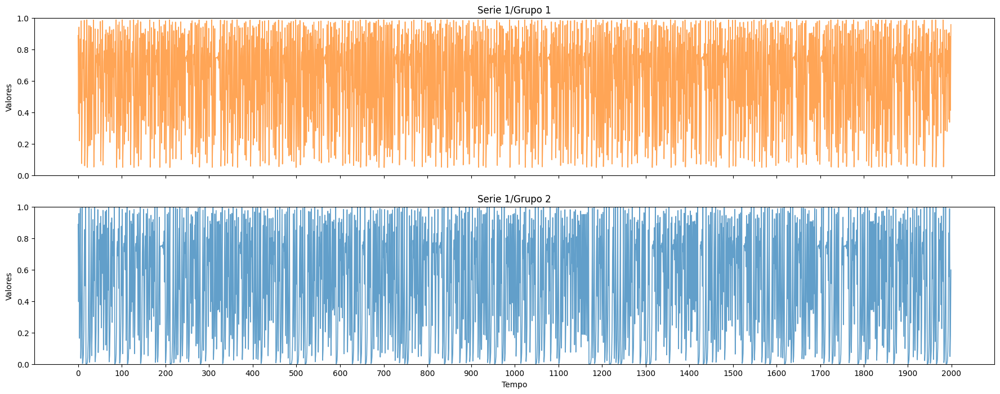

In [ ]:
# Criando figura com dois gráficos (2 linhas, 1 coluna)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(22, 8), sharex=True)
ax1.plot(
    serie1_origem1['valores'],
    alpha=0.7,
    linewidth=1.2,
    color='tab:orange'
)
ax1.set_title('Serie 1/Grupo 1')
ax1.set_ylabel('Valores')
ax1.set_ylim(0.0, 1.0)

ax2.plot(
    serie1_origem2['valores'],
    label='Origem 2',
    alpha=0.7,
    linewidth=1.2,
    color='tab:blue'
)

ax2.set_title('Serie 1/Grupo 2')
ax2.set_xlabel('Tempo')
ax2.set_ylabel('Valores')
ax2.set_ylim(0.0, 1.0)
ax2.set_xticks(range(0, 2001, 100))

plt.show()

In [ ]:
# nos temos 25 series como as de cima. Sendo 1 para cada origem. sendo assim, 50 series.
# nos podemos melhorar a vizualização acima, se nos fizermos uma média móvel e diminuindo a serie para 1000 pontos. para ver se observando uma tendencia
# ou podemos dar um zoom temporal na série para observar melhor o comportamento do dado.

/tmp/ipython-input-3168231608.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('viridis', num_series)


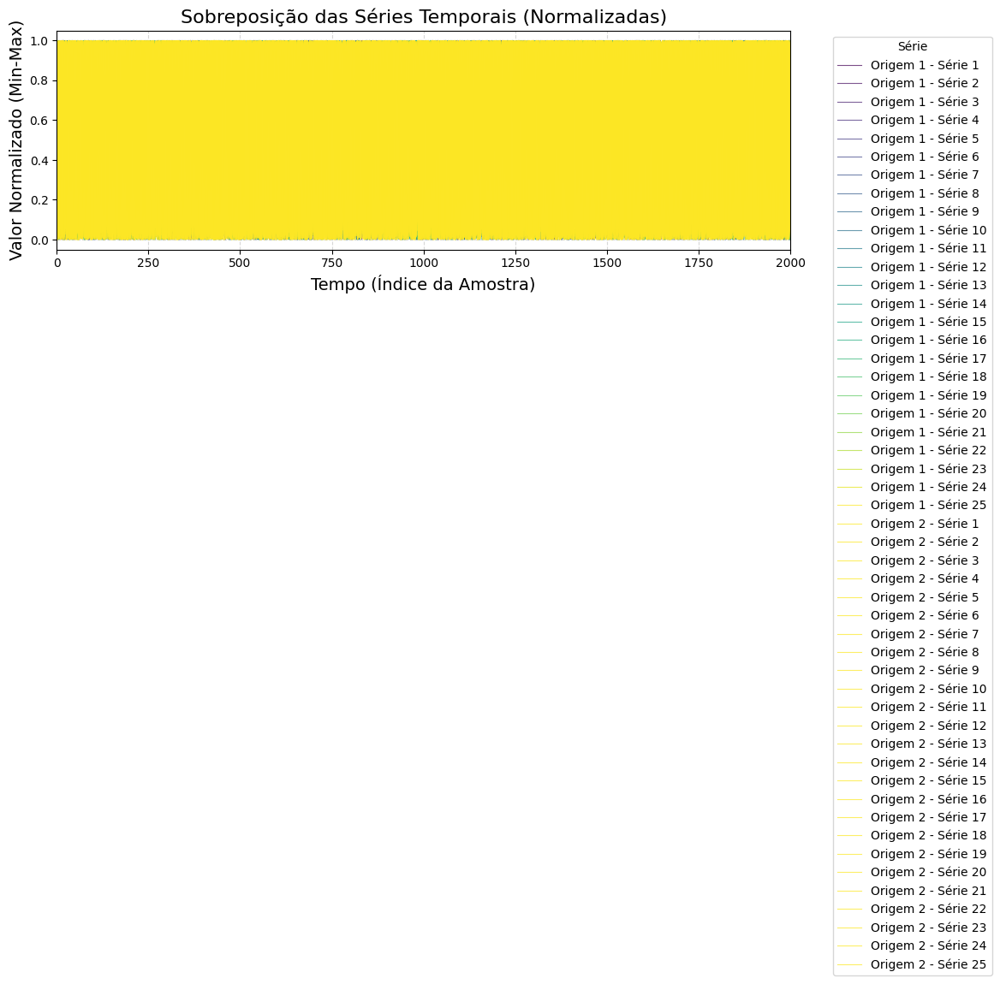

In [13]:
#Explorando melhor as análises gráficas

#Primeira analise: todos os dados juntos normalizados em um único gráfico

def plot_all_series_normalized(file_name="dados_sensibilidade.txt"):
    num_series = len(dados["serie"].unique())
    colors = plt.cm.get_cmap('viridis', num_series)

    plt.figure(figsize=(14, 8))
    combined_keys = dados.groupby(["origem", "serie"])
    color_index = 0

    for (origem, serie), data_group in combined_keys:
        x = data_group["valores"].values
        # Normalizando a serie para o intervalo [0, 1].
        if x.max() != x.min():
            x_norm = (x - x.min()) / (x.max() - x.min())
        else:
            x_norm = np.zeros_like(x)
        # Geração do Rótulo e Cor
        label = f"Origem {origem} - Série {serie}"
        color = colors(color_index / num_series)
        # Plotagem
        plt.plot(x_norm, label=label, color=color, linewidth=0.8, alpha=0.7)
        color_index += 1

    #Gráfico
    plt.title("Sobreposição das Séries Temporais (Normalizadas)", fontsize=16)
    plt.xlabel("Tempo (Índice da Amostra)", fontsize=14)
    plt.ylabel("Valor Normalizado (Min-Max)", fontsize=14)
    plt.xlim(0.0, 2000)

    plt.legend(title="Série", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()

plot_all_series_normalized()

/tmp/ipython-input-940644630.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('hsv', num_series)


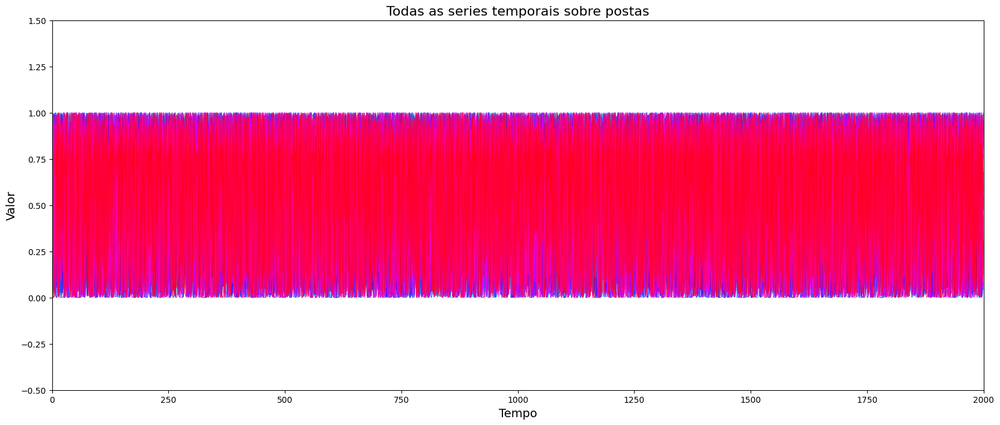

In [14]:
#2° Gráfico
def plot_all_series_raw(file_name="dados_sensibilidade.txt"):
    combined_keys = dados.groupby(["origem", "serie"])
    num_series = len(combined_keys)
    colors = plt.cm.get_cmap('hsv', num_series)
    plt.figure(figsize=(20, 8))
    color_index = 0
    for (origem, serie), data_group in combined_keys:
        x_raw = data_group["valores"].values
        label = f"Origem {origem} - Série {serie}"
        color = colors(color_index)
        plt.plot(x_raw, label=label, color=color, linewidth=0.8, alpha=0.7)
        color_index += 1

    #Gráfico
    plt.title("Todas as series temporais sobre postas", fontsize=16)
    plt.xlabel("Tempo", fontsize=14)
    plt.ylabel("Valor", fontsize=14)
    plt.xlim(0.0, 2000)
    plt.ylim(-0.5, 1.5)
    #plt.legend(title="Série", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
    # plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()
plot_all_series_raw()

/tmp/ipython-input-1473114620.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('hsv', num_series)


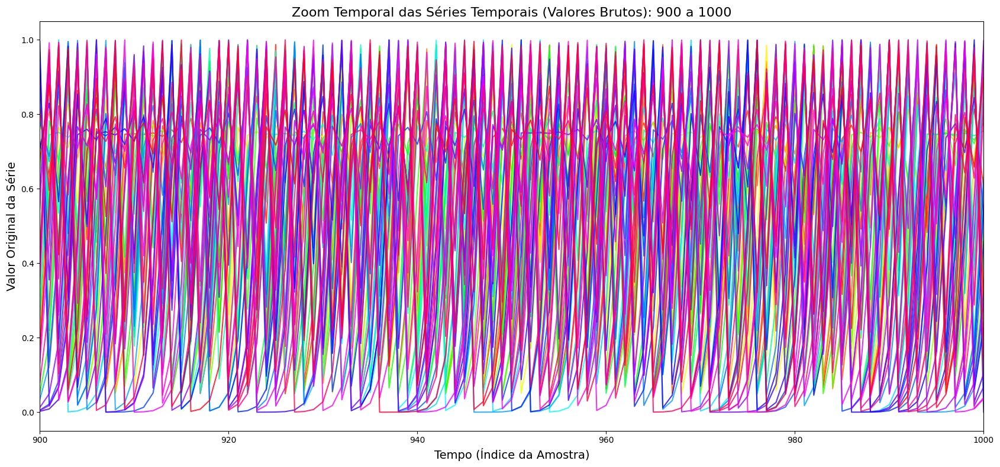

In [15]:
#3° Gráfico com um corte temporal de todos os dados sobrepostos
def plot_series_zoom_raw(file_name="dados_sensibilidade.txt", start_time=900, end_time=1000, step_x_axis=10):
    combined_keys = dados.groupby(["origem", "serie"])
    num_series = len(combined_keys)
    colors = plt.cm.get_cmap('hsv', num_series)
    plt.figure(figsize=(20, 8))
    color_index = 0

    for (origem, serie), data_group in combined_keys:
        x_raw_full = data_group["valores"].values
        x_raw_zoom = x_raw_full[start_time : end_time + 1]
        time_index_zoom = np.arange(start_time, start_time + len(x_raw_zoom))
        label = f"Origem {origem} - Série {serie}"
        color = colors(color_index)
        plt.plot(time_index_zoom, x_raw_zoom, label=label, color=color, linewidth=1.5, alpha=0.8)
        color_index += 1

   # plt.xticks(np.arange(start_time, end_time + 1, step_x_axis), fontsize=10, rotation=45)
    plt.title(f"Zoom Temporal das Séries Temporais (Valores Brutos): {start_time} a {end_time}", fontsize=16)
    plt.xlabel("Tempo (Índice da Amostra)", fontsize=14)
    plt.ylabel("Valor Original da Série", fontsize=14)
    plt.xlim(start_time, end_time)
    #plt.legend(title="Série", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()
plot_series_zoom_raw(start_time=900, end_time=1000, step_x_axis=10)

/tmp/ipython-input-2187059282.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('hsv', num_series)


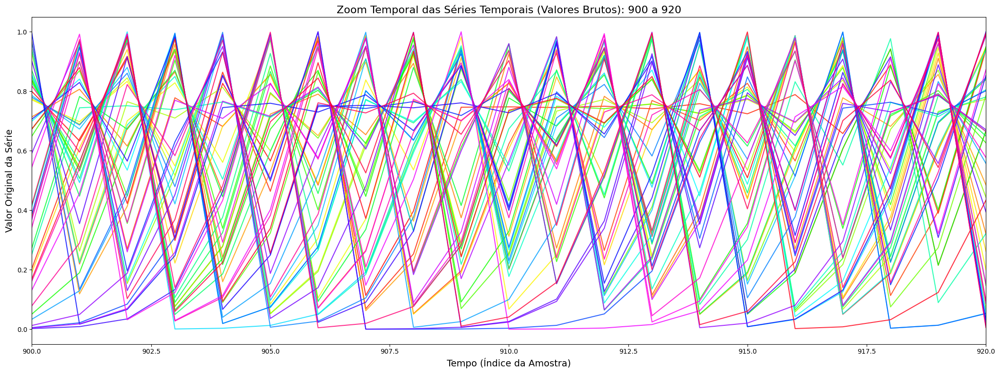

In [18]:
#4° Gráfico com um avanço do corte temporal de todos os dados sobrepostos
def plot_series_zoom_raw(file_name="dados_sensibilidade.txt", start_time=900, end_time=920, step_x_axis=10):
    combined_keys = dados.groupby(["origem", "serie"])
    num_series = len(combined_keys)
    colors = plt.cm.get_cmap('hsv', num_series)
    plt.figure(figsize=(25, 8))
    color_index = 0

    for (origem, serie), data_group in combined_keys:
        x_raw_full = data_group["valores"].values
        x_raw_zoom = x_raw_full[start_time : end_time + 1]
        time_index_zoom = np.arange(start_time, start_time + len(x_raw_zoom))
        label = f"Origem {origem} - Série {serie}"
        color = colors(color_index)
        plt.plot(time_index_zoom, x_raw_zoom, label=label, color=color, linewidth=1.5, alpha=0.8)
        color_index += 1

   # plt.xticks(np.arange(start_time, end_time + 1, step_x_axis), fontsize=10, rotation=45)
    plt.title(f"Zoom Temporal das Séries Temporais (Valores Brutos): {start_time} a {end_time}", fontsize=16)
    plt.xlabel("Tempo (Índice da Amostra)", fontsize=14)
    plt.ylabel("Valor Original da Série", fontsize=14)
    plt.xlim(start_time, end_time)
    #plt.legend(title="Série", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()
plot_series_zoom_raw(start_time=900, end_time=920, step_x_axis=10)

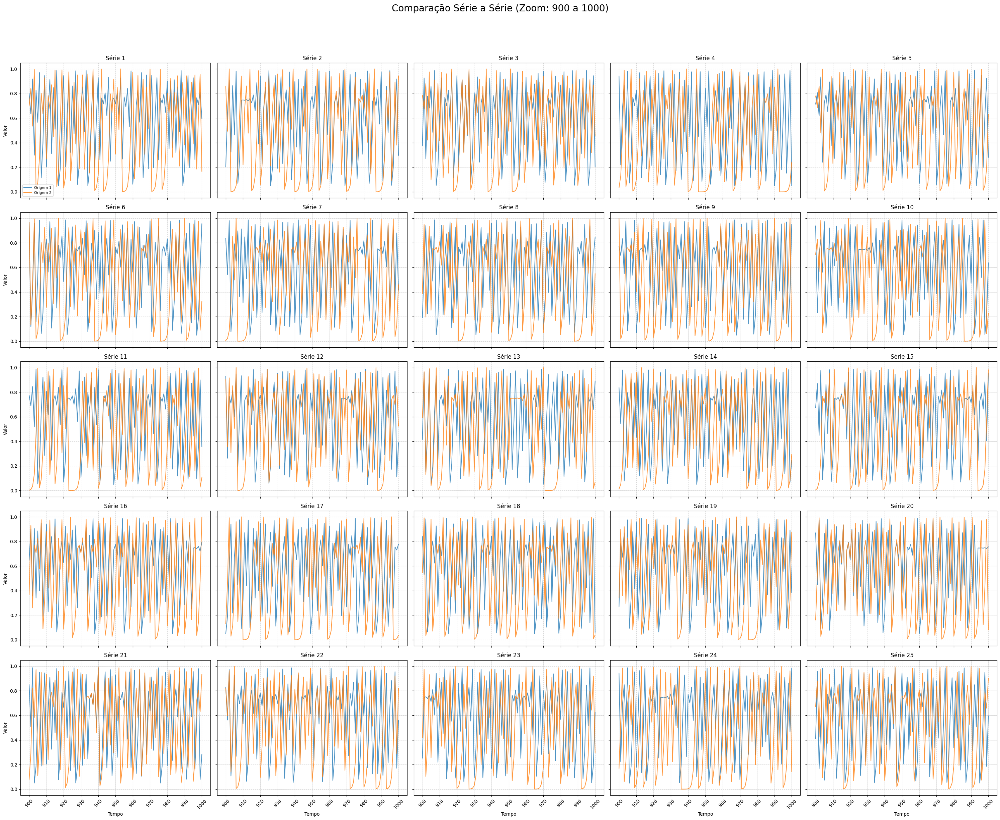

In [20]:
#5° Gráfico - explorando a análise gráfica separadamente por série

def plot_comparison_zoom_subplots(file_name="dados_sensibilidade.txt", start_time=900, end_time=1000, step_x_axis=10):
    num_series = 25
    rows = 5
    cols = 5
    fig, axes = plt.subplots(rows, cols, figsize=(30, 24), sharex=True, sharey=True)
    axes = axes.flatten()
    for i in range(1, num_series + 1):
        ax = axes[i - 1] # Pega o eixo correspondente (ax[0] para Série 1, e assim por diante)
        # Filtrando dados para a Série 'i'
        data_s = dados[dados["serie"] == i]
        # Iterando sobre as duas Origens ou Grupos (1 e 2)
        for origem in [1, 2]:
            data_o = data_s[data_s["origem"] == origem]
            x_raw_full = data_o["valores"].values
            if x_raw_full.size == 0:
                continue # Pula se não houver dados
            x_raw_zoom = x_raw_full[start_time : end_time + 1]
            time_index_zoom = np.arange(start_time, start_time + len(x_raw_zoom))
            label = f"Origem {origem}"
            color = 'C0' if origem == 1 else 'C1' # C0 é azul, C1 é laranja
            ax.plot(time_index_zoom, x_raw_zoom, label=label, color=color, linewidth=1.5, alpha=0.8)

        ax.set_title(f"Série {i}", fontsize=12)
        if i > (num_series - cols):
            ax.set_xlabel("Tempo", fontsize=10)
            ax.set_xticks(np.arange(start_time, end_time + 1, step_x_axis))
            ax.tick_params(axis='x', rotation=45)
        if (i - 1) % cols == 0:
            ax.set_ylabel("Valor", fontsize=10)
        ax.grid(True, linestyle='--', alpha=0.5)
        if i == 1:
            ax.legend(loc='lower left', fontsize=8)

    fig.suptitle(f"Comparação Série a Série (Zoom: {start_time} a {end_time})", fontsize=20, y=1.02)
    plt.tight_layout(rect=[0, 0, 1, 0.98]) # Ajusta o layout com folga para o suptitle
    plt.show()
plot_comparison_zoom_subplots(start_time=900, end_time=1000, step_x_axis=10)

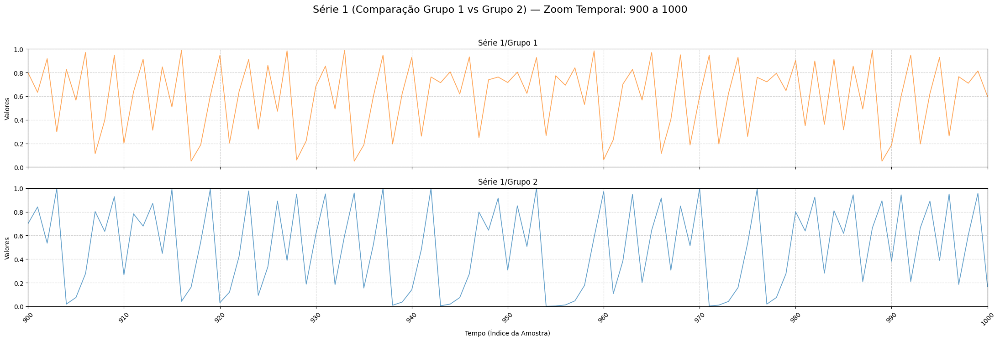

In [28]:
# 6° Gráfico
START_TIME = 900
END_TIME = 1000
STEP_X_AXIS = 10
valores_zoom_g1 = serie1_origem1['valores'].iloc[START_TIME : END_TIME + 1]
valores_zoom_g2 = serie1_origem2['valores'].iloc[START_TIME : END_TIME + 1]
time_index = np.arange(START_TIME, END_TIME + 1)

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(22, 8), sharex=True)
fig.suptitle(f"Série 1 (Comparação Grupo 1 vs Grupo 2) — Zoom Temporal: {START_TIME} a {END_TIME}", fontsize=16)

# Gráfico 1: Série 1 / Grupo 1
ax1.plot(
    time_index,
    valores_zoom_g1,
    alpha=0.7,
    linewidth=1.2,
    color='tab:orange'
)
ax1.set_title('Série 1/Grupo 1')
ax1.set_ylabel('Valores')
ax1.set_ylim(0.0, 1.0)
ax1.grid(True, linestyle='--', alpha=0.6)

# Gráfico 2: Série 1 / Grupo 2
ax2.plot(
    time_index,
    valores_zoom_g2,
    label='Origem 2',
    alpha=0.7,
    linewidth=1.2,
    color='tab:blue'
)

ax2.set_title('Série 1/Grupo 2')
ax2.set_xlabel('Tempo (Índice da Amostra)')
ax2.set_ylabel('Valores')
ax2.set_ylim(0.0, 1.0)
ax2.grid(True, linestyle='--', alpha=0.6)

ax1.set_xlim(START_TIME, END_TIME)
x_ticks_range = np.arange(START_TIME, END_TIME + 1, STEP_X_AXIS)
ax2.set_xticks(x_ticks_range)
ax2.tick_params(axis='x', rotation=45)

plt.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.show()

## -----------------------------------------------------------------------------

# **Contextualizando o trabalho**
O presente trabalho visa investigar o comportamento de 50 sinais temporais sintéticos, divididos entre 25 serie (n=25) observadas sob 2 regimes distintos (Origem 1 e Origem 2). Cada serie possui com comprimento L=2000 pontos de dados por origem.

#------------------------------------------------------------------------------

# Estatísticas descritivas gerais

In [29]:
# Analises de características gerais
total_rows = len(dados)
unique_origens = dados['origem'].nunique()
unique_series = dados['serie'].nunique()
serie_length = dados[dados['origem'] == 1].groupby('serie').size().iloc[0]

In [30]:
#Estatisticas descritivas
stats = dados.groupby(['origem', 'serie'])['valores'].agg(['mean', 'std'])
stats_pivot = stats.unstack(level='origem')

In [31]:
new_cols = []
for stat, origin in stats_pivot.columns:
    new_cols.append(f'Origem{origin}_{stat.capitalize()}')
stats_pivot.columns = new_cols

stats_pivot['Diff_Mean'] = stats_pivot['Origem2_Mean'] - stats_pivot['Origem1_Mean']
stats_pivot['Origem1_CV'] = stats_pivot['Origem1_Std'] / stats_pivot['Origem1_Mean']
stats_pivot['Origem2_CV'] = stats_pivot['Origem2_Std'] / stats_pivot['Origem2_Mean']

final_stats_df = stats_pivot[['Origem1_Mean', 'Origem2_Mean', 'Diff_Mean', 'Origem1_Std', 'Origem2_Std']].round(4)
final_stats_df.index.name = 'Série'

In [32]:

print("Visão Geral das Séries Temporais")
print(f"Total de Origens (Regimes): {unique_origens}")
print(f"Total de Séries (Parâmetros): {unique_series}")
print(f"Comprimento de cada Série (L): {serie_length}")
print('----------------------------------------------------------------------')
print("Estatísticas Descritivas (Média e Desvio Padrão)21")
print(final_stats_df.to_string())
print('----------------------------------------------------------------------')

Visão Geral das Séries Temporais
Total de Origens (Regimes): 2
Total de Séries (Parâmetros): 25
Comprimento de cada Série (L): 2000
----------------------------------------------------------------------
Estatísticas Descritivas (Média e Desvio Padrão)21
       Origem1_Mean  Origem2_Mean  Diff_Mean  Origem1_Std  Origem2_Std
Série                                                                 
1            0.5865        0.4998    -0.0868       0.3069       0.3537
2            0.5807        0.5066    -0.0741       0.3105       0.3512
3            0.5878        0.4997    -0.0881       0.3058       0.3538
4            0.5840        0.4900    -0.0940       0.3084       0.3570
5            0.5828        0.5048    -0.0780       0.3093       0.3519
6            0.5831        0.4961    -0.0869       0.3091       0.3549
7            0.5879        0.4967    -0.0912       0.3058       0.3547
8            0.5909        0.5084    -0.0825       0.3037       0.3504
9            0.5872        0.4892   

In [ ]:
# Podemos observar nas saídas acima que, sistematicamente, as médias das series de origem 1 são maiores do que as médias das series de oriegm 2
# Podemos verificar estatísticamente se essas diferenças são significaticas atraves de um Teste T ou equivalente não paramétrico
# Se as médias forem significativamente maiores, poderemos observar que a situação que foi coletada em 2 teve algum tipo de intervenção
# fazendo com que a média do sinal coletado aumentasse. Podemos plotar um grafíco de barras que mostre essa difrença.

In [ ]:
# Estacionaridade
# Se observarmos no gráfico gerado na célula 20, ao compararmos a serie 1 de origem 1 e origem 2, não conseguimos
# observar se existe algum tipo de tendencia nos dados. nós podemos observar que eles variam entre 0.0 e 1.0.
# mas, pela analise vizual, nao podemos dizer se existe algum tipo de variação consistente no tempo
# Por isso, vamos fazer o teste de estacionaridade, que verificará se existe tendencias, sazonalidade ou ciclos.

In [ ]:
# Estacionariedade (Teste ADF)
# Reconstruindo matriz origem × série × tempo
matriz = np.zeros((unique_origens, unique_series, serie_length))

for o in range(1, 3):
    for s in range(1, 26):
        matriz[o-1, s-1] = dados[(dados["origem"]==o) &
                              (dados["serie"]==s)]["valores"].values
resultados = []

for s in range(unique_series):
    serie_o1 = matriz[0, s]
    serie_o2 = matriz[1, s]

    # ADF origem 1
    adf1 = adfuller(serie_o1)
    stat1, p1 = adf1[0], adf1[1]

    # ADF origem 2
    adf2 = adfuller(serie_o2)
    stat2, p2 = adf2[0], adf2[1]

    resultados.append([
        s+1,
        stat1, p1,
        stat2, p2,
        "Estacionária"     if p1 < 0.05 else "Não estacionária",
        "Estacionária"     if p2 < 0.05 else "Não estacionária"
    ])

tabela = pd.DataFrame(resultados, columns=[
    "Série",
    "ADF_Origem1", "p_Origem1",
    "ADF_Origem2", "p_Origem2",
    "Interpretação Origem 1",
    "Interpretação Origem 2"
])

# print(tabela.to_string(index=False))
tabela

,Série,ADF_Origem1,p_Origem1,ADF_Origem2,p_Origem2,Interpretação Origem 1,Interpretação Origem 2
0,1,-26.195747,0.000000,-44.763532,0.000000,Estacionária,Estacionária
1,2,-24.561996,0.000000,-45.108937,0.000000,Estacionária,Estacionária
2,3,-24.606310,0.000000,-44.834025,0.000000,Estacionária,Estacionária
3,4,-26.143481,0.000000,-44.084710,0.000000,Estacionária,Estacionária
4,5,-19.845826,0.000000,-26.686145,0.000000,Estacionária,Estacionária
5,6,-23.183156,0.000000,-20.907430,0.000000,Estacionária,Estacionária
6,7,-15.825351,0.000000,-44.202793,0.000000,Estacionária,Estacionária
7,8,-26.010148,0.000000,-30.316748,0.000000,Estacionária,Estacionária
8,9,-23.267022,0.000000,-42.749910,0.000000,Estacionária,Estacionária
9,10,-25.272409,0.000000,-44.692515,0.000000,Estacionária,Estacionária


from matplotlib import pyplot as plt
tabela['Série'].plot(kind='hist', bins=20, title='Série')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
tabela['ADF_Origem1'].plot(kind='hist', bins=20, title='ADF_Origem1')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
tabela['p_Origem1'].plot(kind='hist', bins=20, title='p_Origem1')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
tabela['ADF_Origem2'].plot(kind='hist', bins=20, title='ADF_Origem2')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
tabela.plot(kind='scatter', x='Série', y='ADF_Origem1', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
tabela.plot(kind='scatter', x='ADF_Origem1', y='p_Origem1', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
tabela.plot(kind='scatter', x='p_Origem1', y='ADF_Origem2', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
tabela.plot(kind='scatter', x='ADF_Origem2', y='p_Origem2', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Série']
  ys = series['ADF_Origem1']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = tabela.sort_values('Série', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Série')
_ = plt.ylabel('ADF_Origem1')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Série']
  ys = series['p_Origem1']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = tabela.sort_values('Série', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Série')
_ = plt.ylabel('p_Origem1')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Série']
  ys = series['ADF_Origem2']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = tabela.sort_values('Série', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Série')
_ = plt.ylabel('ADF_Origem2')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Série']
  ys = series['p_Origem2']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = tabela.sort_values('Série', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Série')
_ = plt.ylabel('p_Origem2')

from matplotlib import pyplot as plt
tabela['Série'].plot(kind='line', figsize=(8, 4), title='Série')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
tabela['ADF_Origem1'].plot(kind='line', figsize=(8, 4), title='ADF_Origem1')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
tabela['p_Origem1'].plot(kind='line', figsize=(8, 4), title='p_Origem1')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
tabela['ADF_Origem2'].plot(kind='line', figsize=(8, 4), title='ADF_Origem2')
plt.gca().spines[['top', 'right']].set_visible(False)

In [ ]:
# Podemos observar que o teste de estacionaridade mostrou que todas as series são estacionárias,
# independente da origem. Isso prova que não exite tendencias ou ciclos ou sazonalidades nos dados.
# nosso próximo passo é mostrar um grafico de autocorrelação

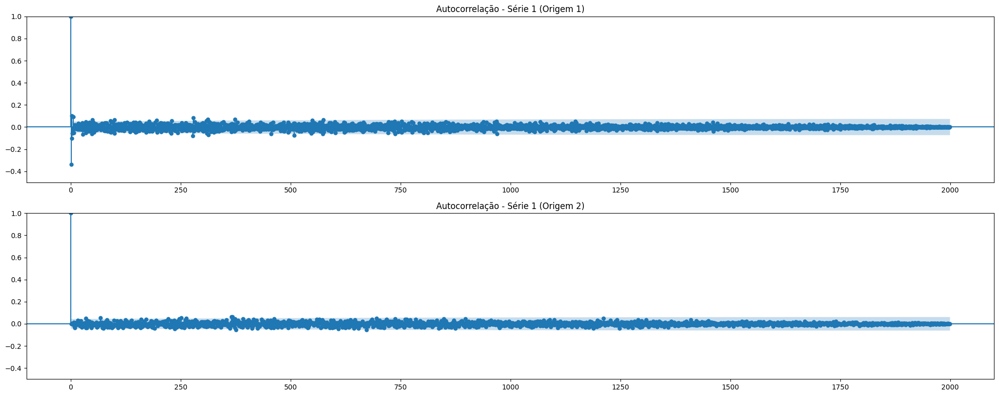

In [33]:
# Grafico de autocorrelação da serie 1 para a origem 1 e origem 2

# série 1 origem 1
serie1_o1 = dados[(dados["origem"] == 1) & (dados["serie"] == 1)]["valores"].values

# série 1 origem 2
serie1_o2 = dados[(dados["origem"] == 2) & (dados["serie"] == 1)]["valores"].values

# Gráfico 1
fig, axes = plt.subplots(2, 1, figsize=(20, 8))
plot_acf(serie1_o1, ax=axes[0], lags=1999)
axes[0].set_title("Autocorrelação - Série 1 (Origem 1)")
axes[0].set_ylim(-0.50, 1.0)

plot_acf(serie1_o2, ax=axes[1], lags=1999)
axes[1].set_title("Autocorrelação - Série 1 (Origem 2)")
axes[1].set_ylim(-0.50, 1.0)

plt.tight_layout()
plt.show()

In [ ]:
#Podemos observar que, embora nosso teste estatístico de estacionaridade tenha dado positivo para estacionario,
#analisando a serie 1 de origem 1 e origem 2, alguns pontos saem da estacionarida duramnte toda a serie
#Podemos modificar o grafico pra ver esses pontos que saem da margem de estacionaridade

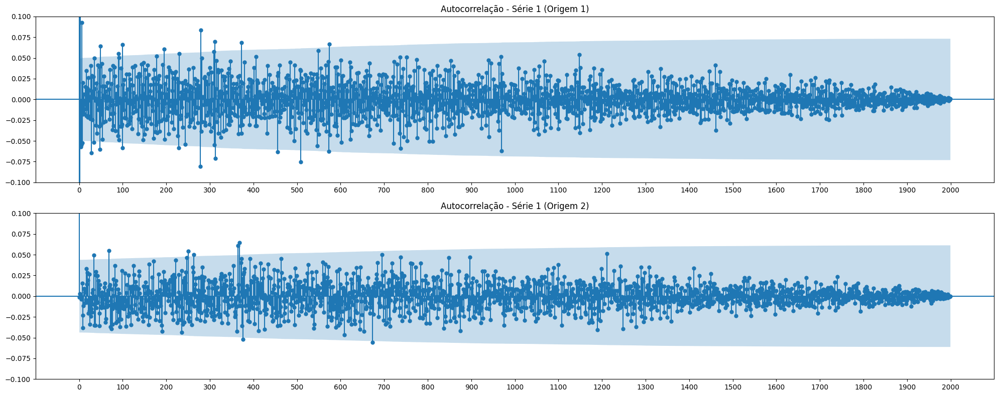

In [34]:
# Gráfico 2 - Ampliando a vizualização
fig, axes = plt.subplots(2, 1, figsize=(20, 8))
plot_acf(serie1_o1, ax=axes[0], lags=1999)
axes[0].set_title("Autocorrelação - Série 1 (Origem 1)")
axes[0].set_ylim(-0.10, 0.10)
axes[0].set_xticks(range(0, 2001, 100))

plot_acf(serie1_o2, ax=axes[1], lags=1999)
axes[1].set_title("Autocorrelação - Série 1 (Origem 2)")
axes[1].set_ylim(-0.10, 0.10)
axes[1].set_xticks(range(0, 2001, 100))

plt.tight_layout()
plt.show()

In [ ]:
#Podemos observar que no grafico 2 os pontos que saem da estacionaridade.
#Podemos observar também que que existe uma padrao, ou seja, as propriedades estatísticas não mudam com o tempo
#Podemos gerar um gráfico que amplia a vizualiazação para observar melhor o comportamento.

#------------------------------------------------------------------------------

# Teste de Entropia Amostral

In [ ]:
# Vamos aplicar agora o teste de entropia amostral
# Vamos comparar a entropia de cada serie de origem 1 e origem 2

Teste 1 de parametros de entropia amostral

**m=2**

**r 0.2*std**




In [ ]:
# Sample Entropy Function
# Parâmetros: m=2, r = 0.2 * Desvio Padrão local

def sample_entropy(U, m=2, r_factor=0.2):
    """Calculo da Entropia Amostral para cada série temporal ."""

    U = np.array(U)
    N = len(U)
    std = np.std(U)
    r = r_factor * std

    if N < m + 2 or std == 0:
        return np.nan

    # 1. Função para criar vetores de embedding
    def get_embedded_vectors(series, dim):
        # N - dim + 1 vetores
        return [series[i:i+dim] for i in range(N - dim + 1)]

    # 2. Função para contar pares que se encaixam (distância máxima <= r)
    def count_matches(vectors):
        count = 0
        L = len(vectors)
        for i in range(L):
            for j in range(i + 1, L): # Pares não-auto-combinados (j > i)
                dist = np.max(np.abs(vectors[i] - vectors[j]))
                if dist <= r:
                    count += 1
        return count

    # Contagem para o comprimento m (N_m, que corresponde a B)
    X_m = get_embedded_vectors(U, m)
    N_m = count_matches(X_m)

    # Contagem para o comprimento m+1 (N_m+1, que corresponde a A)
    X_m_plus_1 = get_embedded_vectors(U, m + 1)
    N_m_plus_1 = count_matches(X_m_plus_1)

    # SampEn = -ln(N_m+1 / N_m)
    if N_m == 0 or N_m_plus_1 == 0:
        # Se for zero, a série é perfeitamente previsível ou não-previsível (com ln(0))
        # Retorna NaN, pois o logaritmo não está definido.
        return np.nan

    return -np.log(N_m_plus_1 / N_m)

# 3. Carregar e Aplicar a Função
df = pd.read_csv('dados_sensibilidade.txt', sep=' ')
df.columns = df.columns.str.replace('"', '')
df = df.dropna()
df['serie'] = df['serie'].astype(int)
df['origem'] = df['origem'].astype(int)

# Aplicar SampEn a todas as 50 séries
results = df.groupby(['origem', 'serie'])['valores'].apply(sample_entropy).to_frame(name='SampEn')

# 4. Pivotar e apresentar resultados
sampen_pivot = results.unstack(level='origem')
sampen_pivot.columns = ['Origem1_SampEn', 'Origem2_SampEn']

# Calcular a diferença na complexidade
sampen_pivot['Diff_SampEn'] = sampen_pivot['Origem2_SampEn'] - sampen_pivot['Origem1_SampEn']

# Organizar e imprimir a saída
print("Análise de Entropia Amostral")
print("Parâmetros de Cálculo: m=2, r = 0.2 * Desvio Padrão Local")
print(sampen_pivot.round(4).to_string())

# sampen_pivot.round(4).to_csv('entropia_amostral_comparativa.csv')
# print("\nTabela de entropia amostral salva em 'entropia_amostral_comparativa.csv'.")

--- Análise de Entropia Amostral (Complexidade e Não-Linearidade) ---
Parâmetros de Cálculo: m=2, r = 0.2 * Desvio Padrão Local
       Origem1_SampEn  Origem2_SampEn  Diff_SampEn
serie                                             
1              0.5725          0.6361       0.0635
2              0.5632          0.6469       0.0837
3              0.5638          0.6390       0.0752
4              0.5651          0.6341       0.0690
5              0.5756          0.6312       0.0556
6              0.5723          0.6304       0.0581
7              0.5825          0.6364       0.0540
8              0.5751          0.6408       0.0657
9              0.5857          0.6297       0.0440
10             0.5894          0.6313       0.0419
11             0.5734          0.6411       0.0677
12             0.5436          0.6485       0.1049
13             0.5723          0.6356       0.0633
14             0.5753          0.6423       0.0669
15             0.5696          0.6381       0.0685
16   

Teste 2 de parametrso de entropia amostral

**m=4**

**r=0.2*std**

In [ ]:
# Sample Entropy Function (based on standard definition for m=2)
# Parâmetros: m=4, r = 0.2 * Desvio Padrão local

def sample_entropy(U, m=4, r_factor=0.2):
    """Calcula a Entropia Amostral (Sample Entropy) para a série temporal U."""

    U = np.array(U)
    N = len(U)
    std = np.std(U)
    r = r_factor * std

    # Condição de rigor
    if N < m + 2 or std == 0:
        return np.nan

    # 1. Função para criar vetores de embedding
    def get_embedded_vectors(series, dim):
        # N - dim + 1 vetores
        return [series[i:i+dim] for i in range(N - dim + 1)]

    # 2. Função para contar pares que se encaixam (distância máxima <= r)
    def count_matches(vectors):
        count = 0
        L = len(vectors)
        for i in range(L):
            for j in range(i + 1, L): # Pares não-auto-combinados (j > i)
                dist = np.max(np.abs(vectors[i] - vectors[j]))
                if dist <= r:
                    count += 1
        return count

    # Contagem para o comprimento m (N_m, que corresponde a B)
    X_m = get_embedded_vectors(U, m)
    N_m = count_matches(X_m)

    # Contagem para o comprimento m+1 (N_m+1, que corresponde a A)
    X_m_plus_1 = get_embedded_vectors(U, m + 1)
    N_m_plus_1 = count_matches(X_m_plus_1)

    # SampEn = -ln(N_m+1 / N_m)
    if N_m == 0 or N_m_plus_1 == 0:
        # Se for zero, a série é perfeitamente previsível ou não-previsível (com ln(0))
        # Retorna NaN, pois o logaritmo não está definido.
        return np.nan

    return -np.log(N_m_plus_1 / N_m)

# 3. Carregar e Aplicar a Função
df = pd.read_csv('dados_sensibilidade.txt', sep=' ')
df.columns = df.columns.str.replace('"', '')
df = df.dropna()
df['serie'] = df['serie'].astype(int)
df['origem'] = df['origem'].astype(int)

# Aplicar SampEn a todas as 50 séries
results = df.groupby(['origem', 'serie'])['valores'].apply(sample_entropy).to_frame(name='SampEn')

# 4. Pivotar e apresentar resultados
sampen_pivot = results.unstack(level='origem')
sampen_pivot.columns = ['Origem1_SampEn', 'Origem2_SampEn']

# Calcular a diferença na complexidade
sampen_pivot['Diff_SampEn'] = sampen_pivot['Origem2_SampEn'] - sampen_pivot['Origem1_SampEn']

# Organizar e imprimir a saída
print("Análise de Entropia Amostral")
print("Parâmetros de Cálculo: m=4, r = 0.2 * Desvio Padrão Local")
print(sampen_pivot.round(4).to_string())

# sampen_pivot.round(4).to_csv('entropia_amostral_comparativa.csv')
# print("\nTabela de entropia amostral salva em 'entropia_amostral_comparativa.csv'.")

Análise de Entropia Amostral
Parâmetros de Cálculo: m=4, r = 0.2 * Desvio Padrão Local
       Origem1_SampEn  Origem2_SampEn  Diff_SampEn
serie                                             
1              0.5267          0.6395       0.1127
2              0.5129          0.6551       0.1422
3              0.5107          0.6493       0.1387
4              0.5062          0.6446       0.1383
5              0.5337          0.6435       0.1097
6              0.5241          0.6404       0.1163
7              0.5284          0.6495       0.1211
8              0.5335          0.6537       0.1202
9              0.5456          0.6395       0.0939
10             0.5445          0.6424       0.0978
11             0.5302          0.6499       0.1197
12             0.4851          0.6514       0.1663
13             0.5252          0.6466       0.1214
14             0.5170          0.6495       0.1326
15             0.5240          0.6435       0.1195
16             0.5155          0.6424       0.

Teste 3 de parametrso de entropia amostral

**m=2**

**r=0.5*std**

In [ ]:
# Sample Entropy Function (based on standard definition for m=2)
# Parâmetros: m=2, r = 0.5 * Desvio Padrão local

def sample_entropy(U, m=4, r_factor=0.5):
    """Calcula a Entropia Amostral (Sample Entropy) para a série temporal U."""

    U = np.array(U)
    N = len(U)
    std = np.std(U)
    r = r_factor * std

    # Condição de rigor
    if N < m + 2 or std == 0:
        return np.nan

    # 1. Função para criar vetores de embedding
    def get_embedded_vectors(series, dim):
        # N - dim + 1 vetores
        return [series[i:i+dim] for i in range(N - dim + 1)]

    # 2. Função para contar pares que se encaixam (distância máxima <= r)
    def count_matches(vectors):
        count = 0
        L = len(vectors)
        for i in range(L):
            for j in range(i + 1, L): # Pares não-auto-combinados (j > i)
                dist = np.max(np.abs(vectors[i] - vectors[j]))
                if dist <= r:
                    count += 1
        return count

    # Contagem para o comprimento m (N_m, que corresponde a B)
    X_m = get_embedded_vectors(U, m)
    N_m = count_matches(X_m)

    # Contagem para o comprimento m+1 (N_m+1, que corresponde a A)
    X_m_plus_1 = get_embedded_vectors(U, m + 1)
    N_m_plus_1 = count_matches(X_m_plus_1)

    # SampEn = -ln(N_m+1 / N_m)
    if N_m == 0 or N_m_plus_1 == 0:
        # Se for zero, a série é perfeitamente previsível ou não-previsível (com ln(0))
        # Retorna NaN, pois o logaritmo não está definido.
        return np.nan

    return -np.log(N_m_plus_1 / N_m)

# 3. Carregar e Aplicar a Função
df = pd.read_csv('dados_sensibilidade.txt', sep=' ')
df.columns = df.columns.str.replace('"', '')
df = df.dropna()
df['serie'] = df['serie'].astype(int)
df['origem'] = df['origem'].astype(int)

# Aplicar SampEn a todas as 50 séries
results = df.groupby(['origem', 'serie'])['valores'].apply(sample_entropy).to_frame(name='SampEn')

# 4. Pivotar e apresentar resultados
sampen_pivot = results.unstack(level='origem')
sampen_pivot.columns = ['Origem1_SampEn', 'Origem2_SampEn']

# Calcular a diferença na complexidade
sampen_pivot['Diff_SampEn'] = sampen_pivot['Origem2_SampEn'] - sampen_pivot['Origem1_SampEn']

# Organizar e imprimir a saída
print("Análise de Entropia Amostral")
print("Parâmetros de Cálculo: m=4, r = 0.5 * Desvio Padrão Local")
print(sampen_pivot.round(4).to_string())

# sampen_pivot.round(4).to_csv('entropia_amostral_comparativa.csv')
# print("\nTabela de entropia amostral salva em 'entropia_amostral_comparativa.csv'.")

Análise de Entropia Amostral
Parâmetros de Cálculo: m=4, r = 0.5 * Desvio Padrão Local
       Origem1_SampEn  Origem2_SampEn  Diff_SampEn
serie                                             
1              0.4994          0.6123       0.1129
2              0.4903          0.6189       0.1286
3              0.5026          0.6108       0.1082
4              0.4998          0.6080       0.1082
5              0.5003          0.6082       0.1079
6              0.5039          0.6064       0.1025
7              0.5170          0.6062       0.0892
8              0.5215          0.6066       0.0851
9              0.5032          0.6121       0.1089
10             0.5008          0.6013       0.1005
11             0.4933          0.6126       0.1193
12             0.4924          0.6088       0.1164
13             0.4969          0.6103       0.1134
14             0.4972          0.6079       0.1107
15             0.4994          0.6030       0.1036
16             0.5140          0.6162       0.

# Algumas conclusões
 - Ao variar os parametros de calculo de entropia amostral **(m e r*std)**, nos podemos observar como variação tambem dos valores de entropia de series de origem 1 vs series de origem 2.
- O primieiro valor de m e r estabelecidos foram m=2 e r= 0.2*std. Estes valores foram estabelecidos como base para as analises posteriores por serem convencionalmente usados quando não se tem conhecimento da natureza da origem dos dados. Com estes valores, pudemos observar que a entropia amostral pareada das series de origem 1 foram sistematicamente menores do que as das series de oriegm 2. Isso mostra que existe um aumento no grau da desordem, aleatoriedade e incerteza nas series de origem 2 comparado as series de origem 1. **Poderiamos hipotetizar que a series de origem 1 foram coletadas de indivídos caminhando e as series de origem 2 foram deste indivíduos correndo? Seria esses dados de um padrão de movimento aonde é introduzido uma intervenção que aumenta variabilidade dos dodos na serie 2?** Nos podemos, certamente, dizer que as series são pareadas, pois foram codificadas com mesmo ID para diferentes oriegens, independentemente se foram coletados de humanos em duas situações experimentais diferentes.

- Ao variarmos os parametros do calculo da entropia amostral de m=2 para m=4 e mantermos os valores de r=0.2*std, podemos observar que o padrão visto acima não foi alterado. As series de oriegm 1 são maiores que as series de origem 2. Mantendo as hipoteses que foram levantas

- Nessa perspectiva, ao variarmos os parametros do calculo da entropia amostral de r=0.2*sdt para r=0.5*std, mantendo os valores originais de m=2, podemos observar que o pdrão foi mantido, ou seja, os valores de entropia amostral da serie de origem 1 se mantivaram maiores do que a serie de oriegm 2, mostrando que, embora variarmos os parametros, parece que o grau de incerteza dos dados de origem 1 são consistentemente menores que os dados de origem 2.   

* Com todas as limitações que temos com estes dados, podemos dizer que, se são dados realmente sisntéticos, as series de origem 2 foram gerados uando o mesmo padrão das series de origem 1 no entendo, foi adicionado uma estocasticidade aos dados durante a geração.  

Teste 4 de parametros de entropia amostral

**m=1**

**r=0.2*std**


In [ ]:
# Sample Entropy Function (based on standard definition for m=2)
# Parâmetros: m=1, r = 0.2 * Desvio Padrão local

def sample_entropy(U, m=1, r_factor=0.2):
    """Calcula a Entropia Amostral (Sample Entropy) para a série temporal U."""

    U = np.array(U)
    N = len(U)
    std = np.std(U)
    r = r_factor * std

    # Condição de rigor
    if N < m + 2 or std == 0:
        return np.nan

    # 1. Função para criar vetores de embedding
    def get_embedded_vectors(series, dim):
        # N - dim + 1 vetores
        return [series[i:i+dim] for i in range(N - dim + 1)]

    # 2. Função para contar pares que se encaixam (distância máxima <= r)
    def count_matches(vectors):
        count = 0
        L = len(vectors)
        for i in range(L):
            for j in range(i + 1, L): # Pares não-auto-combinados (j > i)
                dist = np.max(np.abs(vectors[i] - vectors[j]))
                if dist <= r:
                    count += 1
        return count

    # Contagem para o comprimento m (N_m, que corresponde a B)
    X_m = get_embedded_vectors(U, m)
    N_m = count_matches(X_m)

    # Contagem para o comprimento m+1 (N_m+1, que corresponde a A)
    X_m_plus_1 = get_embedded_vectors(U, m + 1)
    N_m_plus_1 = count_matches(X_m_plus_1)

    # SampEn = -ln(N_m+1 / N_m)
    if N_m == 0 or N_m_plus_1 == 0:
        # Se for zero, a série é perfeitamente previsível ou não-previsível (com ln(0))
        # Retorna NaN, pois o logaritmo não está definido.
        return np.nan

    return -np.log(N_m_plus_1 / N_m)

# 3. Carregar e Aplicar a Função
df = pd.read_csv('dados_sensibilidade.txt', sep=' ')
df.columns = df.columns.str.replace('"', '')
df = df.dropna()
df['serie'] = df['serie'].astype(int)
df['origem'] = df['origem'].astype(int)

# Aplicar SampEn a todas as 50 séries
results = df.groupby(['origem', 'serie'])['valores'].apply(sample_entropy).to_frame(name='SampEn')

# 4. Pivotar e apresentar resultados
sampen_pivot = results.unstack(level='origem')
sampen_pivot.columns = ['Origem1_SampEn', 'Origem2_SampEn']

# Calcular a diferença na complexidade
sampen_pivot['Diff_SampEn'] = sampen_pivot['Origem2_SampEn'] - sampen_pivot['Origem1_SampEn']

# Organizar e imprimir a saída
print("Análise de Entropia Amostral")
print("Parâmetros de Cálculo: m=1, r = 0.2 * Desvio Padrão Local")
print(sampen_pivot.round(4).to_string())

# sampen_pivot.round(4).to_csv('entropia_amostral_comparativa.csv')
# print("\nTabela de entropia amostral salva em 'entropia_amostral_comparativa.csv'.")

Análise de Entropia Amostral
Parâmetros de Cálculo: m=1, r = 0.2 * Desvio Padrão Local
       Origem1_SampEn  Origem2_SampEn  Diff_SampEn
serie                                             
1              0.6606          0.7256       0.0650
2              0.6530          0.7298       0.0768
3              0.6613          0.7232       0.0619
4              0.6608          0.7167       0.0559
5              0.6536          0.7243       0.0707
6              0.6542          0.7157       0.0616
7              0.6648          0.7180       0.0532
8              0.6661          0.7191       0.0530
9              0.6622          0.7157       0.0536
10             0.6614          0.7172       0.0558
11             0.6526          0.7214       0.0689
12             0.6368          0.7231       0.0863
13             0.6513          0.7193       0.0681
14             0.6533          0.7254       0.0721
15             0.6473          0.7167       0.0694
16             0.6541          0.7238       0.

Teste 5 de parametrso de entropia amostral

**m=4**

**r=0.2**

In [ ]:
# Sample Entropy Function (based on standard definition for m=2)
# Parâmetros: m=4, r = 0.2 * Desvio Padrão local

def sample_entropy(U, m=4, r_factor=0.2):
    """Calcula a Entropia Amostral (Sample Entropy) para a série temporal U."""

    U = np.array(U)
    N = len(U)
    std = np.std(U)
    r = r_factor * std

    # Condição de rigor
    if N < m + 2 or std == 0:
        return np.nan

    # 1. Função para criar vetores de embedding
    def get_embedded_vectors(series, dim):
        # N - dim + 1 vetores
        return [series[i:i+dim] for i in range(N - dim + 1)]

    # 2. Função para contar pares que se encaixam (distância máxima <= r)
    def count_matches(vectors):
        count = 0
        L = len(vectors)
        for i in range(L):
            for j in range(i + 1, L): # Pares não-auto-combinados (j > i)
                dist = np.max(np.abs(vectors[i] - vectors[j]))
                if dist <= r:
                    count += 1
        return count

    # Contagem para o comprimento m (N_m, que corresponde a B)
    X_m = get_embedded_vectors(U, m)
    N_m = count_matches(X_m)

    # Contagem para o comprimento m+1 (N_m+1, que corresponde a A)
    X_m_plus_1 = get_embedded_vectors(U, m + 1)
    N_m_plus_1 = count_matches(X_m_plus_1)

    # SampEn = -ln(N_m+1 / N_m)
    if N_m == 0 or N_m_plus_1 == 0:
        # Se for zero, a série é perfeitamente previsível ou não-previsível (com ln(0))
        # Retorna NaN, pois o logaritmo não está definido.
        return np.nan

    return -np.log(N_m_plus_1 / N_m)

# 3. Carregar e Aplicar a Função
df = pd.read_csv('dados_sensibilidade.txt', sep=' ')
df.columns = df.columns.str.replace('"', '')
df = df.dropna()
df['serie'] = df['serie'].astype(int)
df['origem'] = df['origem'].astype(int)

# Aplicar SampEn a todas as 50 séries
results = df.groupby(['origem', 'serie'])['valores'].apply(sample_entropy).to_frame(name='SampEn')

# 4. Pivotar e apresentar resultados
sampen_pivot = results.unstack(level='origem')
sampen_pivot.columns = ['Origem1_SampEn', 'Origem2_SampEn']

# Calcular a diferença na complexidade
sampen_pivot['Diff_SampEn'] = sampen_pivot['Origem2_SampEn'] - sampen_pivot['Origem1_SampEn']

# Organizar e imprimir a saída
print("Análise de Entropia Amostral")
print("Parâmetros de Cálculo: m=4, r = 0.2 * Desvio Padrão Local")
print(sampen_pivot.round(4).to_string())

# sampen_pivot.round(4).to_csv('entropia_amostral_comparativa.csv')
# print("\nTabela de entropia amostral salva em 'entropia_amostral_comparativa.csv'.")

Análise de Entropia Amostral
Parâmetros de Cálculo: m=4, r = 0.2 * Desvio Padrão Local
       Origem1_SampEn  Origem2_SampEn  Diff_SampEn
serie                                             
1              0.5267          0.6395       0.1127
2              0.5129          0.6551       0.1422
3              0.5107          0.6493       0.1387
4              0.5062          0.6446       0.1383
5              0.5337          0.6435       0.1097
6              0.5241          0.6404       0.1163
7              0.5284          0.6495       0.1211
8              0.5335          0.6537       0.1202
9              0.5456          0.6395       0.0939
10             0.5445          0.6424       0.0978
11             0.5302          0.6499       0.1197
12             0.4851          0.6514       0.1663
13             0.5252          0.6466       0.1214
14             0.5170          0.6495       0.1326
15             0.5240          0.6435       0.1195
16             0.5155          0.6424       0.

# Algumas observações:
- Variando os parametros do calculo de entropia amostral nos tivemos os mesmo padroes descritos anteriormente.

# -------------------------------------------------------------------------------

# Análise de Recorrência

In [ ]:
# Vamos fazer a analise de recorrência nos dados para cada serie temporal
# Vamos analisar a Taxa de recorrÊncia, Determinismo e Laminaridade
# Depois vamos fazer um teste estatístico para avaliar a diferença


In [ ]:
# Mas primeiro temos que calcular os valores de perda de informação
# e de dimensão de cada serie cde cada origem.

##Calculo de **perda de informação** da serie temporal

In [ ]:
#função para perda de informação

def time_delay_MI(x, max_lag=100):
    """
    Calcula MI para defasagens de 1 até max_lag.
    Retorna:
        tau_opt  -> primeiro mínimo local da curva MI
        MI       -> vetor de MI para todos os lags
    """
    x = np.array(x)

    # Discretização robusta
    bins = int(np.ceil(1 + np.log2(len(x))))  # regra de Sturges
    hist = np.histogram(x, bins=bins)[1]
    x_disc = np.digitize(x, hist)

    MI = []

    for lag in range(1, max_lag+1):
        y = np.roll(x_disc, -lag)
        mi_val = mutual_info_score(x_disc[:-lag], y[:-lag])
        MI.append(mi_val)

    MI = np.array(MI)

    # tau ótimo = primeiro mínimo local
    tau_opt = np.argmin(MI) + 1

    return tau_opt, MI


# Análise de **vizinhos falsos médio**

In [ ]:
# Analise de vizinhos falsos médio
def cao_embedding_dimension(x, max_m=12, tau=1, eps=1e-10):
    x = np.asarray(x).astype(float)
    N = len(x)

    def embed(x, m, tau):
        L = N - (m - 1) * tau
        if L <= 0:
            return np.empty((0, m))
        return np.array([x[i : i + m*tau : tau] for i in range(L)])

    E1 = []
    E2 = []

    for m in range(1, max_m + 1):
        Xm_full  = embed(x, m, tau)
        Xm1_full = embed(x, m+1, tau)

        K = Xm1_full.shape[0]
        if K <= 1:
            E1.append(np.nan)
            if m > 1:
                E2.append(np.nan)
            continue

        Xm = Xm_full[:K, :]
        Xm1 = Xm1_full[:K, :]

        # matriz de distâncias no embedding m
        diffs = Xm[:, None, :] - Xm[None, :, :]
        dists = np.linalg.norm(diffs, axis=2)
        np.fill_diagonal(dists, np.inf)

        nn_idx = np.argmin(dists, axis=1)

        num = np.linalg.norm(Xm1 - Xm1[nn_idx], axis=1)
        den = np.linalg.norm(Xm  - Xm[nn_idx],  axis=1)

        ratio = num / (den + eps)
        E1_m = np.mean(ratio)
        E1.append(E1_m)

        if m > 1:
            E2.append(E1_m / (E1[-2] + eps))

    E1 = np.array(E1)
    E2 = np.array(E2)

    # critério de estabilização para escolher m
    diffs = np.abs(np.diff(E1))
    m_opt = max_m
    for i, d in enumerate(diffs):
        if d < 1e-3:
            m_opt = i + 1
            break

    return m_opt, E1, E2


In [ ]:
def analyze_all_series(file_name="dados_sensibilidade.txt", max_lag=100, max_m=12):
    df = pd.read_csv(file_name, sep=" ")
    df.columns = ["origem","serie","valores"]

    results = []

    for origem in sorted(df["origem"].unique()):
        for serie in sorted(df["serie"].unique()):

            x = df[(df["origem"]==origem) & (df["serie"]==serie)]["valores"].values

            # --- 1. Tau ótimo pela MI ---
            tau_opt, MI = time_delay_MI(x, max_lag=max_lag)
            MI_tau = MI[tau_opt - 1]  # perda de informação

            # --- 2. Dimensão ótima m pelo Método de Cao ---
            m_opt, E1, E2 = cao_embedding_dimension(x, max_m=max_m, tau=tau_opt)

            results.append({
                "origem": origem,
                "serie": serie,
                "tau_opt": tau_opt,
                "MI_tau": MI_tau,
                "m_opt": m_opt
            })

    results_df = pd.DataFrame(results)
    return results_df


In [ ]:
table = analyze_all_series("dados_sensibilidade.txt")

print(table)

    origem  serie  tau_opt    MI_tau  m_opt
0        1      1       22  0.025729     12
1        1      2       60  0.023100     12
2        1      3       54  0.026180     12
3        1      4       67  0.025270     12
4        1      5       52  0.023355     12
5        1      6       51  0.025413     12
6        1      7       25  0.026604     12
7        1      8       69  0.023974     12
8        1      9       69  0.025951     12
9        1     10       69  0.026781     12
10       1     11       64  0.025606     12
11       1     12       74  0.024992     12
12       1     13       52  0.025760     12
13       1     14       58  0.020949     12
14       1     15       73  0.025603     12
15       1     16       18  0.024307     12
16       1     17       54  0.025715     12
17       1     18       78  0.026910     12
18       1     19       71  0.024475     12
19       1     20       85  0.023267     12
20       1     21       98  0.026254     12
21       1     22       28  0.02

##Função de **RQA** para obter **TAXA DE RECORRENCIA, DETERMINISMO e LIMIARIDADE**

In [35]:
# ============================================================
# Função para gerar a matriz de recorrência (RP)
# ============================================================
def recurrence_matrix(U, m=3, tau=2, epsilon_factor=None, target_RR=0.05):
    """
    Retorna RP e o epsilon utilizado.
    Se epsilon_factor=None, ajusta epsilon automaticamente para atingir RR desejado.
    """
    N = len(U)
    max_idx = N - (m - 1) * tau
    Y = np.array([U[i:i + m*tau:tau] for i in range(max_idx)])

    # Distâncias
    D = cdist(Y, Y, metric="chebyshev")

    # ===== Ajuste automático de epsilon para atingir RR desejado =====
    if epsilon_factor is None:
        flat = D.flatten()
        eps = np.percentile(flat, target_RR * 100)
    else:
        eps = epsilon_factor * np.max(D)

    # RP
    R = (D <= eps).astype(int)

    # REMOVE DIAGONAL PRINCIPAL (IMPORTANTÍSSIMO)
    np.fill_diagonal(R, 0)

    return R, eps


# ============================================================
# Função para calcular métricas RQA
# ============================================================
def compute_rqa(R, l_min=2, v_min=2):
    L = R.shape[0]

    # RR
    RR = np.sum(R) / (L * L)

    # -------------------------
    # DIAGONAIS
    # -------------------------
    diag_lengths = []
    for k in range(-L+1, L):
        if k == 0:  # ignorar diagonal principal
            continue
        diag = np.diag(R, k)
        count = 0
        for v in diag:
            if v == 1:
                count += 1
            else:
                if count >= l_min:
                    diag_lengths.append(count)
                count = 0
        if count >= l_min:
            diag_lengths.append(count)

    if diag_lengths:
        Lmax = max(diag_lengths)
        DET = np.sum(diag_lengths) / np.sum(R)
    else:
        Lmax = 0
        DET = 0

    # -------------------------
    # VERTICAIS
    # -------------------------
    vert_lengths = []
    for col in range(L):
        count = 0
        for row in range(L):
            if R[row, col] == 1:
                count += 1
            else:
                if count >= v_min:
                    vert_lengths.append(count)
                count = 0
        if count >= v_min:
            vert_lengths.append(count)

    if vert_lengths:
        LAM = np.sum(vert_lengths) / np.sum(R)
        TT = np.mean(vert_lengths)
    else:
        LAM = 0
        TT = 0

    return {
        "RR": RR,
        "Lmax": Lmax,
        "DET": DET,
        "LAM": LAM,
        "TT": TT
    }


# ============================================================
# Função geral — RP + RQA + Plot
# ============================================================
def run_RP_and_RQA(U, m=3, tau=2, target_RR=0.05, title="RP"):
    R, eps = recurrence_matrix(U, m=m, tau=tau, target_RR=target_RR)

    rqa_metrics = compute_rqa(R)

    print("\n==============================")
    print(f"{title}")
    print(f"Epsilon escolhido = {eps:.5f}")
    print("RQA =", rqa_metrics)
    print("==============================")

    plt.figure(figsize=(6, 6))
    plt.imshow(R, cmap="binary", origin="lower")
    plt.title(title)
    plt.xlabel("Tempo")
    plt.ylabel("Tempo")
    plt.show()

    return R, rqa_metrics


✅ Análise de Recorrência Completa: RP — Série 1 (Origem 1)
Parâmetros de Entrada (m, tau): (3, 2)
RR Desejado: 0.1
--- Resultados ---
Epsilon Calculado ($\epsilon$): 0.24140
RR Real (Recurrence Rate): 0.099500
Lmax (Maximum Line Length): 22
DET (Determinism): 0.506761
LAM (Laminarity): 0.046104
TT (Trapping Time): 2.475416


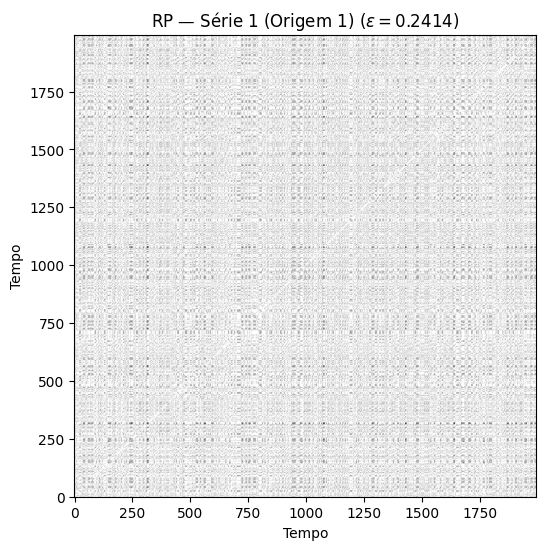


✅ Análise de Recorrência Completa: RP — Série 1 (Origem 2)
Parâmetros de Entrada (m, tau): (3, 2)
RR Desejado: 0.1
--- Resultados ---
Epsilon Calculado ($\epsilon$): 0.33229
RR Real (Recurrence Rate): 0.099500
Lmax (Maximum Line Length): 21
DET (Determinism): 0.471721
LAM (Laminarity): 0.104196
TT (Trapping Time): 2.279848


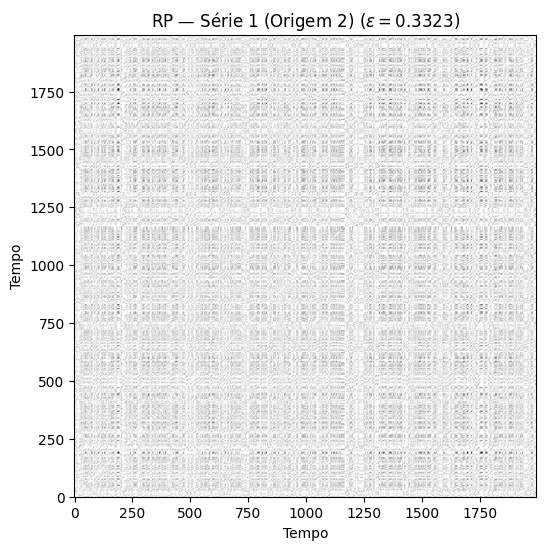

In [ ]:
df = pd.read_csv("dados_sensibilidade.txt", sep=" ")
df.columns = ["origem","serie","valores"]

serie1_o1 = df[(df["origem"]==1) & (df["serie"]==1)]["valores"].values
serie1_o2 = df[(df["origem"]==2) & (df["serie"]==1)]["valores"].values

R1, rqa1 = run_RP_and_RQA(serie1_o1, m=3, tau=2, target_RR=0.10,
                          title="RP — Série 1 (Origem 1)")

R2, rqa2 = run_RP_and_RQA(serie1_o2, m=3, tau=2, target_RR=0.10,
                          title="RP — Série 1 (Origem 2)")



✅ Análise de Recorrência Completa: RP — Série 1 (Origem 1)
Parâmetros de Entrada (m, tau): (3, 2)
RR Desejado: 0.1
--- Resultados ---
Epsilon Calculado ($\epsilon$): 0.24002
RR Real (Recurrence Rate): 0.099499
Lmax (Maximum Line Length): 24
DET (Determinism): 0.503908
LAM (Laminarity): 0.048955
TT (Trapping Time): 2.324072


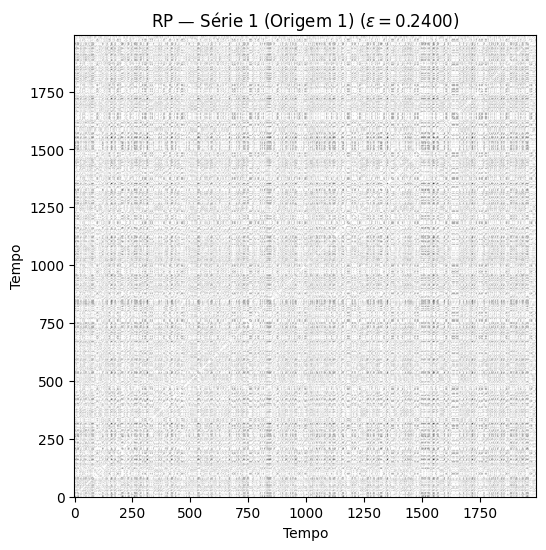


✅ Análise de Recorrência Completa: RP — Série 1 (Origem 2)
Parâmetros de Entrada (m, tau): (3, 2)
RR Desejado: 0.1
--- Resultados ---
Epsilon Calculado ($\epsilon$): 0.34406
RR Real (Recurrence Rate): 0.099499
Lmax (Maximum Line Length): 21
DET (Determinism): 0.465074
LAM (Laminarity): 0.128714
TT (Trapping Time): 2.257755


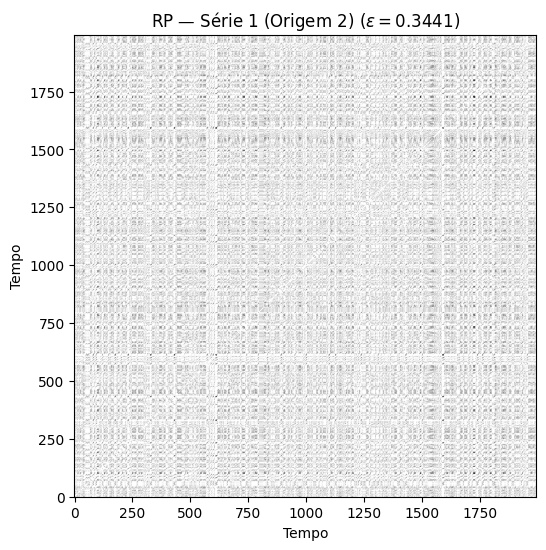

In [ ]:
serie1_o1 = df[(df["origem"]==1) & (df["serie"]==9)]["valores"].values
serie1_o2 = df[(df["origem"]==2) & (df["serie"]==9)]["valores"].values

R1, rqa1 = run_RP_and_RQA(serie1_o1, m=3, tau=2, target_RR=0.10,
                          title="RP — Série 1 (Origem 1)")

R2, rqa2 = run_RP_and_RQA(serie1_o2, m=3, tau=2, target_RR=0.10,
                          title="RP — Série 1 (Origem 2)")


✅ Análise de Recorrência Completa: RP — Série 1 (Origem 1)
Parâmetros de Entrada (m, tau): (3, 2)
RR Desejado: 0.1
--- Resultados ---
Epsilon Calculado ($\epsilon$): 0.23785
RR Real (Recurrence Rate): 0.099499
Lmax (Maximum Line Length): 27
DET (Determinism): 0.514634
LAM (Laminarity): 0.048864
TT (Trapping Time): 2.335986


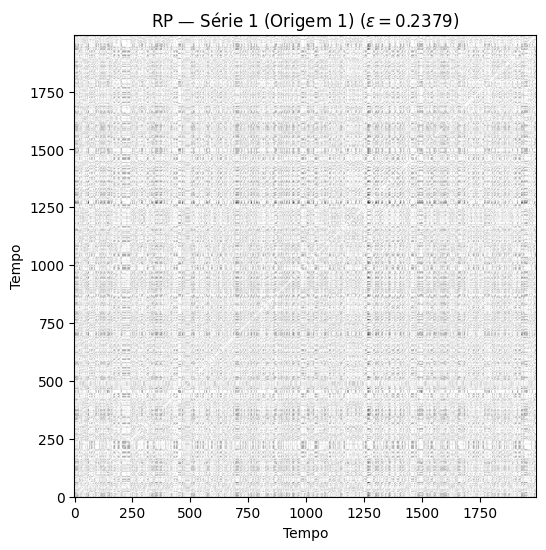


✅ Análise de Recorrência Completa: RP — Série 1 (Origem 2)
Parâmetros de Entrada (m, tau): (3, 2)
RR Desejado: 0.1
--- Resultados ---
Epsilon Calculado ($\epsilon$): 0.33528
RR Real (Recurrence Rate): 0.099499
Lmax (Maximum Line Length): 22
DET (Determinism): 0.477102
LAM (Laminarity): 0.074078
TT (Trapping Time): 2.144057


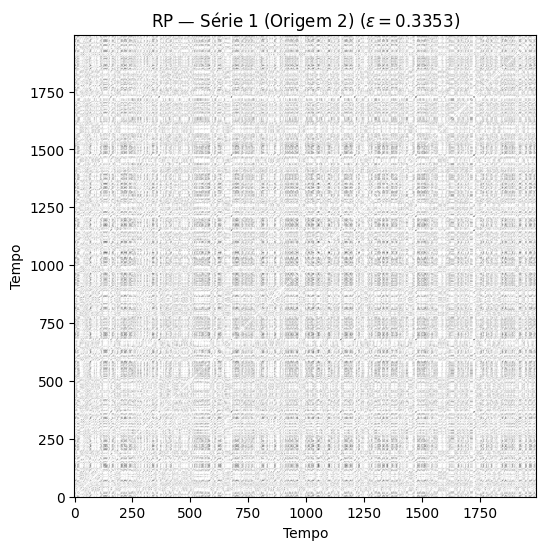

In [ ]:
serie1_o1 = df[(df["origem"]==1) & (df["serie"]==22)]["valores"].values
serie1_o2 = df[(df["origem"]==2) & (df["serie"]==22)]["valores"].values

R1, rqa1 = run_RP_and_RQA(serie1_o1, m=3, tau=2, target_RR=0.10,
                          title="RP — Série 1 (Origem 1)")

R2, rqa2 = run_RP_and_RQA(serie1_o2, m=3, tau=2, target_RR=0.10,
                          title="RP — Série 1 (Origem 2)")

In [42]:
# Função geral — RP + RQA + Plot
def run_RP_and_RQA(U, m=3, tau=2, target_RR=0.05, title="RP"):
    # 1. Calcular a Matriz de Recorrência e Epsilon
    R, eps = recurrence_matrix(U, m=m, tau=tau, target_RR=target_RR)

    # 2. Calcular as Métricas RQA
    rqa_metrics = compute_rqa(R)

    results = {
        "title": title,
        "m_used": m,
        "tau_used": tau,
        "target_RR_used": target_RR,
        "epsilon_calculated": eps,
        "RR": rqa_metrics["RR"],
        "Lmax": rqa_metrics["Lmax"],
        "DET": rqa_metrics["DET"],
        "LAM": rqa_metrics["LAM"],
        "TT": rqa_metrics["TT"]
    }

    print("\n=============================================")
    print(f"Análise de Recorrência Completa: {title}")
    print("=============================================")
    print(f"Parâmetros de Entrada (m, tau): ({m}, {tau})")
    print(f"RR Desejado: {target_RR}")
    print("--- Resultados ---")
    print(f"Epsilon Calculado ($\\epsilon$): {results['epsilon_calculated']:.5f}")
    print(f"RR Real (Recurrence Rate): {results['RR']:.6f}")
    print(f"Lmax (Maximum Line Length): {results['Lmax']}")
    print(f"DET (Determinism): {results['DET']:.6f}")
    print(f"LAM (Laminarity): {results['LAM']:.6f}")
    print(f"TT (Trapping Time): {results['TT']:.6f}")
    print("=============================================")

    # 5. Plotar a Matriz de Recorrência (RP)
    plt.figure(figsize=(6, 6))
    plt.imshow(R, cmap="binary", origin="lower")
    plt.title(f"{title} ($\\epsilon={results['epsilon_calculated']:.4f}$)")
    plt.xlabel("Tempo")
    plt.ylabel("Tempo")
    plt.show()

    # 6. Retornar a Matriz e o Dicionário de Resultados
    return R, results

In [43]:
MAX_LAG_MI = 50   # Máximo atraso a ser testado na MI
MAX_M_CAO = 12    # Máxima dimensão a ser testada no Cao
TARGET_RR_RQA = 0.15 # Target RR para a RQA (Ex: 15% de recorrência para melhor visualização)

def run_batch_rqa_analysis(file_name="dados_sensibilidade.txt"):
    """
    Executa a sequência completa: MI -> Cao -> RQA para todas as séries,
    e retorna um DataFrame com todos os resultados.
    """

    try:
        df = pd.read_csv(file_name, sep=" ")
    except FileNotFoundError:
        print(f"Erro: Arquivo '{file_name}' não encontrado.")
        return pd.DataFrame()

    df.columns = df.columns.str.replace('"', '').str.strip()
    df = df.dropna()

    results = []

    # Agrupar por Origem e Série
    grouped_data = df.groupby(["origem", "serie"])

    print(f"Iniciando análise de {len(grouped_data)} séries...")

    for (origem, serie), data_group in grouped_data:
        x = data_group["valores"].values

        # Garantir tamanho mínimo para o embedding
        if len(x) < MAX_M_CAO * MAX_LAG_MI:
             print(f"Série {origem}-{serie} muito curta. Pulando.")
             continue

        # --- 1. Tau ótimo pela MI ---
        # time_delay_MI deve retornar o primeiro mínimo local (tau_opt)
        tau_opt, MI = time_delay_MI(x, max_lag=MAX_LAG_MI)
        MI_tau = MI[tau_opt - 1] # Valor da MI no tau_opt (Perda de Informação)

        # --- 2. Dimensão ótima m pelo Método de Cao ---
        # m_opt deve ser o ponto de estabilização E1
        m_opt, E1, E2 = cao_embedding_dimension(x, max_m=MAX_M_CAO, tau=tau_opt)

        # --- 3. RQA usando os parâmetros ótimos ---
        # recurrence_matrix e compute_rqa devem estar definidos
        R, eps = recurrence_matrix(x, m=m_opt, tau=tau_opt, target_RR=TARGET_RR_RQA)
        rqa_metrics = compute_rqa(R)

        # Coletar todos os resultados
        results.append({
            "origem": origem,
            "serie": serie,
            "N": len(x),
            "tau_opt": tau_opt,
            "m_opt": m_opt,
            "epsilon_RQA": eps,
            "MI_tau": MI_tau,
            **rqa_metrics
        })

    results_df = pd.DataFrame(results)
    return results_df



# Executando a análise
rqa_results_table = run_batch_rqa_analysis(file_name='dados_sensibilidade.txt')

# Imprimir o DataFrame
if not rqa_results_table.empty:
    print("\nTabela de Resultados RQA - Análise de Lote (Origem 1 vs Origem 2)")
    print("-" * 75)
    pd.options.display.float_format = '{:.6f}'.format
    print(rqa_results_table)
    rqa_results_table.to_csv('rqa_resultados_completos.csv', index=False)

Iniciando análise de 50 séries...


NameError: name 'time_delay_MI' is not defined

In [ ]:
dados_rqa = pd.read_csv('rqa_resultados_completos.csv')
dados_rqa.describe()

,origem,serie,N,tau_opt,m_opt,epsilon_RQA,MI_tau,RR,Lmax,DET,LAM,TT
count,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000
mean,1.500000,13.000000,2000.000000,8.920000,12.000000,0.731596,0.035199,0.149476,8.920000,0.209399,0.289329,2.214835
std,0.505076,7.284314,0.000000,2.423019,0.000000,0.053614,0.006546,0.000007,7.275455,0.018768,0.051774,0.065787
min,1.000000,1.000000,2000.000000,5.000000,12.000000,0.669136,0.024172,0.149455,5.000000,0.174609,0.217995,2.117276
25%,1.000000,7.000000,2000.000000,7.000000,12.000000,0.678988,0.030749,0.149471,6.000000,0.193042,0.239500,2.152723
50%,1.500000,13.000000,2000.000000,8.500000,12.000000,0.730210,0.034986,0.149477,6.000000,0.212183,0.292491,2.232460
75%,2.000000,19.000000,2000.000000,11.000000,12.000000,0.783053,0.039384,0.149482,7.000000,0.223534,0.341470,2.272833
max,2.000000,25.000000,2000.000000,16.000000,12.000000,0.797243,0.058425,0.149488,44.000000,0.242408,0.362405,2.327924


In [ ]:
from sklearn.metrics import mutual_info_score
from scipy.spatial.distance import cdist, pdist
# 1. FUNÇÃO PARA O CÁLCULO DE TAU ÓTIMO (MI)
def time_delay_MI(x: np.ndarray, max_lag: int = 100) -> tuple[int, np.ndarray]:
    """Calcula MI e retorna o tau_opt (primeiro mínimo local)."""
    x = np.array(x)
    N = len(x)
    bins = int(np.ceil(1 + np.log2(N)))
    hist_limits = np.histogram(x, bins=bins)[1]
    x_disc = np.digitize(x, hist_limits)

    MI = []
    for lag in range(1, max_lag + 1):
        X_t = x_disc[:-lag]
        Y_tau = x_disc[lag:]
        mi_val = mutual_info_score(X_t, Y_tau)
        MI.append(mi_val)

    MI = np.array(MI)
    tau_opt = -1
    for i in range(1, len(MI) - 1):
        if (MI[i] < MI[i-1]) and (MI[i] < MI[i+1]):
            tau_opt = i + 1
            break
    if tau_opt == -1:
        tau_opt = np.argmin(MI) + 1

    return tau_opt, MI

# 2. FUNÇÃO PARA O CÁLCULO DE DIMENSÃO ÓTIMA (CAO)
def cao_embedding_dimension(x: np.ndarray, max_m: int = 12, tau: int = 1) -> tuple[int, np.ndarray, np.ndarray]:
    """Calcula a dimensão de imersão ótima 'm' usando o método de Cao (1997)."""
    x = np.asarray(x).astype(float)
    N = len(x)

    def embed(data, m, tau):
        L = N - (m - 1) * tau
        if L <= 0: return np.empty((0, m))
        return np.array([data[i : i + m*tau : tau] for i in range(L)])

    E1, E2 = [], []
    for m in range(1, max_m + 1):
        Xm = embed(x, m, tau)
        Xm1_full = embed(x, m + 1, tau)

        K = min(Xm.shape[0], Xm1_full.shape[0])
        if K <= 1:
            E1.append(np.nan)
            if m > 1: E2.append(np.nan)
            continue

        Xm = Xm[:K, :]
        Xm1 = Xm1_full[:K, :]

        D = cdist(Xm, Xm, metric='chebyshev')
        np.fill_diagonal(D, np.inf)
        nn_idx = np.argmin(D, axis=1)

        num = np.max(np.abs(Xm1 - Xm1[nn_idx]), axis=1)
        den = np.max(np.abs(Xm - Xm[nn_idx]), axis=1)
        ratio = num / np.where(den == 0, 1e-10, den)
        E1_m = np.mean(ratio)
        E1.append(E1_m)

        if m > 1:
            E2_m = E1_m / (E1[-2] + 1e-10)
            E2.append(E2_m)

    E1 = np.array(E1)
    E2 = np.array(E2)

    diffs = np.abs(np.diff(E1))
    m_opt = max_m
    for i, d in enumerate(diffs):
        if d < 1e-3:
            m_opt = i + 1
            break

    return m_opt, E1, E2

# 3. FUNÇÃO PARA GERAR A MATRIZ DE RECORRÊNCIA (RP)
def recurrence_matrix(U, m=3, tau=2, epsilon_factor=None, target_RR=0.05):
    """Retorna RP e o epsilon utilizado."""
    N = len(U)
    max_idx = N - (m - 1) * tau
    Y = np.array([U[i:i + m*tau:tau] for i in range(max_idx)])

    D = cdist(Y, Y, metric="chebyshev")

    if epsilon_factor is None:
        flat = D.flatten()
        eps = np.percentile(flat, target_RR * 100)
    else:
        eps = epsilon_factor * np.max(D)

    R = (D <= eps).astype(int)
    np.fill_diagonal(R, 0) # REMOVE DIAGONAL PRINCIPAL

    return R, eps

# 4. FUNÇÃO PARA CALCULAR MÉTRICAS RQA
def compute_rqa(R, l_min=2, v_min=2):
    L = R.shape[0]
    RR = np.sum(R) / (L * L)

    # DIAGONAIS (DET e Lmax)
    diag_lengths = []
    for k in range(-L+1, L):
        if k == 0: continue
        diag = np.diag(R, k)
        count = 0
        for v in diag:
            if v == 1: count += 1
            else:
                if count >= l_min: diag_lengths.append(count)
                count = 0
        if count >= l_min: diag_lengths.append(count)

    sum_R = np.sum(R)
    if diag_lengths:
        Lmax = max(diag_lengths)
        DET = np.sum(diag_lengths) / sum_R if sum_R > 0 else 0
    else:
        Lmax = 0
        DET = 0

    # VERTICAIS (LAM e TT)
    vert_lengths = []
    for col in range(L):
        count = 0
        for row in range(L):
            if R[row, col] == 1: count += 1
            else:
                if count >= v_min: vert_lengths.append(count)
                count = 0
        if count >= v_min: vert_lengths.append(count)

    if vert_lengths:
        LAM = np.sum(vert_lengths) / sum_R if sum_R > 0 else 0
        TT = np.mean(vert_lengths)
    else:
        LAM = 0
        TT = 0

    return {"RR": RR, "Lmax": Lmax, "DET": DET, "LAM": LAM, "TT": TT}

## **Análises Estatísticas**

Para confirmara nossas análise de entropia e análise de recorrência.

In [ ]:

data = {
    'origem': [1]*25 + [2]*25,
    'DET': [
        0.225664, 0.238962, 0.223990, 0.237810, 0.232827, 0.219628, 0.221470, 0.233179, 0.237204, 0.242408,
        0.225681, 0.218393, 0.197346, 0.214947, 0.216182, 0.222166, 0.210211, 0.229093, 0.228054, 0.226906,
        0.200944, 0.237145, 0.215081, 0.219256, 0.209509,
        0.180273, 0.189301, 0.205043, 0.178631, 0.177940, 0.192904, 0.189259, 0.174609, 0.184858, 0.189178,
        0.213036, 0.190461, 0.203977, 0.197641, 0.211329, 0.215362, 0.176557, 0.189401, 0.192101, 0.221498,
        0.193456, 0.214447, 0.202567, 0.206150, 0.195940
    ],
    'LAM': [
        0.245173, 0.252058, 0.234061, 0.238999, 0.229864, 0.237636, 0.239799, 0.226469, 0.241442, 0.249418,
        0.243395, 0.243334, 0.217995, 0.239752, 0.250531, 0.242820, 0.234382, 0.234499, 0.238913, 0.250408,
        0.218859, 0.232659, 0.233460, 0.266941, 0.239416,
        0.324533, 0.346085, 0.345785, 0.332111, 0.322141, 0.341501, 0.341377, 0.323878, 0.342596, 0.343291,
        0.359309, 0.318040, 0.351696, 0.332096, 0.341796, 0.346846, 0.319280, 0.347520, 0.332187, 0.351004,
        0.338437, 0.353123, 0.330428, 0.362405, 0.336714
    ],
    'TT': [
        2.168854, 2.162450, 2.134123, 2.147918, 2.121624, 2.138558, 2.154572, 2.123430, 2.154094, 2.167744,
        2.220908, 2.152362, 2.117276, 2.159996, 2.176366, 2.153805, 2.127752, 2.136843, 2.148433, 2.218445,
        2.119813, 2.141171, 2.152316, 2.297886, 2.161588,
        2.239946, 2.285966, 2.281349, 2.235828, 2.253937, 2.281907, 2.274349, 2.246566, 2.256060, 2.291973,
        2.325893, 2.246939, 2.256351, 2.260003, 2.276478, 2.268287, 2.229092, 2.295133, 2.260610, 2.327924,
        2.260341, 2.292790, 2.301226, 2.286711, 2.247743
    ]
}

df_rqa = pd.DataFrame(data)

origem_1 = df_rqa[df_rqa['origem'] == 1]
origem_2 = df_rqa[df_rqa['origem'] == 2]

metrics = ['DET', 'LAM', 'TT']
statistical_results = []


for metric in metrics:
    group1 = origem_1[metric].values
    group2 = origem_2[metric].values

    # Realiza o teste U de Mann-Whitney
    # Hipótese Nula (H0): Não há diferença na distribuição entre os grupos.
    # Hipótese Alternativa (Ha): Há diferença na distribuição entre os grupos.
    u_stat, p_value = mannwhitneyu(group1, group2, alternative='two-sided')

    # Cálculo das médias
    mean1 = group1.mean()
    mean2 = group2.mean()
    statistical_results.append({
        'Métrica': metric,
        'Média (Origem 1)': f"{mean1:.4f}",
        'Média (Origem 2)': f"{mean2:.4f}",
        'Estatística U': f"{u_stat:.1f}",
        'Valor p': f"{p_value:.10f}",
        'Diferença Significativa ($\alpha=0.05$)?': 'Sim' if p_value < 0.05 else 'Não'
    })

results_df = pd.DataFrame(statistical_results)

print("Resultados do Teste U de Mann-Whitney (Origem 1 vs Origem 2)")
print("Hipótese Nula ($H_0$): As distribuições das métricas são iguais.")
print("-" * 80)
print(results_df.to_markdown(index=False))

📊 Resultados do Teste U de Mann-Whitney (Origem 1 vs Origem 2)
Hipótese Nula ($H_0$): As distribuições das métricas são iguais.
--------------------------------------------------------------------------------
| Métrica   |   Média (Origem 1) |   Média (Origem 2) |   Estatística U |   Valor p | Diferença Significativa ($lpha=0.05$)?     |
|:----------|-------------------:|-------------------:|----------------:|----------:|:----|
| DET       |             0.2234 |             0.1954 |             587 | 1.059e-07 | Sim |
| LAM       |             0.2393 |             0.3394 |               0 | 1.4e-09   | Sim |
| TT        |             2.1583 |             2.2713 |              22 | 1.84e-08  | Sim |


In [ ]:
sampen_origem1 = np.array([
    0.5725, 0.5632, 0.5638, 0.5651, 0.5756, 0.5723, 0.5825, 0.5751, 0.5857, 0.5894,
    0.5734, 0.5436, 0.5723, 0.5753, 0.5696, 0.5701, 0.5438, 0.5677, 0.5733, 0.5685,
    0.5724, 0.5798, 0.5700, 0.5606, 0.5596
])

sampen_origem2 = np.array([
    0.6361, 0.6469, 0.6390, 0.6341, 0.6312, 0.6304, 0.6364, 0.6408, 0.6297, 0.6313,
    0.6411, 0.6485, 0.6356, 0.6423, 0.6381, 0.6425, 0.6448, 0.6277, 0.6439, 0.6387,
    0.6362, 0.6320, 0.6335, 0.6331, 0.6375
])

# Realiza o Teste U de Mann-Whitney
# H0: Não há diferença na complexidade entre os grupos.
u_stat, p_value = mannwhitneyu(sampen_origem1, sampen_origem2, alternative='two-sided')

# Cálculo das médias para interpretação
mean1 = np.mean(sampen_origem1)
mean2 = np.mean(sampen_origem2)

print("Resultados do Teste U de Mann-Whitney para Entropia Amostral (SampEn)")
print("-" * 75)
print(f"Média SampEn (Origem 1): {mean1:.4f}")
print(f"Média SampEn (Origem 2): {mean2:.4f}")
print(f"Diferença de Média:      {mean2 - mean1:.4f} (Maior complexidade na Origem 2)")
print("-" * 75)
print(f"Estatística U de Mann-Whitney: {u_stat:.1f}")
print(f"Valor p: {p_value:.15f}")
print("-" * 75)

if p_value < 0.05:
    print("Conclusão: O Valor p é < 0.05. Rejeita-se a Hipótese Nula.")
    print("Há uma diferença estatisticamente significativa na complexidade entre as duas origens.")
else:
    print("Conclusão: O Valor p é >= 0.05. Não se rejeita a Hipótese Nula.")
    print("Não há evidência de diferença significativa na complexidade entre as origens.")

🔬 Resultados do Teste U de Mann-Whitney para Entropia Amostral (SampEn)
---------------------------------------------------------------------------
Média SampEn (Origem 1): 0.5698
Média SampEn (Origem 2): 0.6373
Diferença de Média:      0.0674 (Maior complexidade na Origem 2)
---------------------------------------------------------------------------
Estatística U de Mann-Whitney: 0.0
Valor p: 0.000000001414379
---------------------------------------------------------------------------
✅ Conclusão: O Valor p é < 0.05. Rejeita-se a Hipótese Nula.
Há uma diferença estatisticamente significativa na complexidade entre as duas origens.


In [39]:
sampen_origem1 = np.array([
    0.5267, 0.5129, 0.5107, 0.5062, 0.5337, 0.5241, 0.5284, 0.5335, 0.5456, 0.5445,
    0.5302, 0.4851, 0.5252, 0.5170, 0.5240, 0.5155, 0.4837, 0.5245, 0.5207, 0.5225,
    0.5312, 0.5573, 0.5307, 0.5141, 0.5176
])
sampen_origem2 = np.array([
    0.6395, 0.6551, 0.6493, 0.6446, 0.6435, 0.6404, 0.6495, 0.6537, 0.6395, 0.6424,
    0.6499, 0.6514, 0.6466, 0.6495, 0.6435, 0.6424, 0.6551, 0.6409, 0.6581, 0.6479,
    0.6428, 0.6425, 0.6457, 0.6461, 0.6509
])

# Realiza o Teste U de Mann-Whitney
# H0: Não há diferença na complexidade entre os grupos.
u_stat, p_value = mannwhitneyu(sampen_origem1, sampen_origem2, alternative='two-sided')

# Cálculo das médias para interpretação
mean1 = np.mean(sampen_origem1)
mean2 = np.mean(sampen_origem2)

print("Resultados do Teste U de Mann-Whitney para Entropia Amostral (SampEn)")
print("-" * 75)
print(f"Média SampEn (Origem 1): {mean1:.4f}")
print(f"Média SampEn (Origem 2): {mean2:.4f}")
print(f"Diferença de Média:      {mean2 - mean1:.4f} (Maior complexidade na Origem 2)")
print("-" * 75)
print(f"Estatística U de Mann-Whitney: {u_stat:.1f}")
print(f"Valor p: {p_value:.15f}")
print("-" * 75)


if p_value < 0.05:
    print("Conclusão: O Valor p é < 0.05. Rejeita-se a Hipótese Nula.")
    print("Há uma diferença estatisticamente significativa na complexidade entre as duas origens.")
else:
    print("Conclusão: O Valor p é >= 0.05. Não se rejeita a Hipótese Nula.")
    print("Não há evidência de diferença significativa na complexidade entre as origens.")

Resultados do Teste U de Mann-Whitney para Entropia Amostral (SampEn)
---------------------------------------------------------------------------
Média SampEn (Origem 1): 0.5226
Média SampEn (Origem 2): 0.6468
Diferença de Média:      0.1242 (Maior complexidade na Origem 2)
---------------------------------------------------------------------------
Estatística U de Mann-Whitney: 0.0
Valor p: 0.000000001409279
---------------------------------------------------------------------------
Conclusão: O Valor p é < 0.05. Rejeita-se a Hipótese Nula.
Há uma diferença estatisticamente significativa na complexidade entre as duas origens.


In [38]:
sampen_origem1 = np.array([
    0.4994, 0.4903, 0.5026, 0.4998, 0.5003, 0.5039, 0.5170, 0.5215, 0.5032, 0.5008,
    0.4933, 0.4924, 0.4969, 0.4972, 0.4994, 0.5140, 0.4880, 0.4902, 0.5132, 0.5073,
    0.5090, 0.5069, 0.4974, 0.4994, 0.4939
])

sampen_origem2 = np.array([
    0.6123, 0.6189, 0.6108, 0.6080, 0.6082, 0.6064, 0.6062, 0.6066, 0.6121, 0.6013,
    0.6126, 0.6088, 0.6103, 0.6079, 0.6030, 0.6162, 0.6145, 0.6063, 0.6111, 0.6030,
    0.6098, 0.5983, 0.6142, 0.6067, 0.6126
])

# Realiza o Teste U de Mann-Whitney
# H0: Não há diferença na complexidade entre os grupos.
u_stat, p_value = mannwhitneyu(sampen_origem1, sampen_origem2, alternative='two-sided')

# Cálculo das médias para interpretação
mean1 = np.mean(sampen_origem1)
mean2 = np.mean(sampen_origem2)

print("Resultados do Teste U de Mann-Whitney para Entropia Amostral (SampEn)")
print("-" * 75)
print(f"Média SampEn (Origem 1): {mean1:.4f}")
print(f"Média SampEn (Origem 2): {mean2:.4f}")
print(f"Diferença de Média:      {mean2 - mean1:.4f} (Maior complexidade na Origem 2)")
print("-" * 75)
print(f"Estatística U de Mann-Whitney: {u_stat:.1f}")
print(f"Valor p: {p_value:.15f}")
print("-" * 75)

if p_value < 0.05:
    print("Conclusão: O Valor p é < 0.05. Rejeita-se a Hipótese Nula.")
    print("Há uma diferença estatisticamente significativa na complexidade entre as duas origens.")
else:
    print("Conclusão: O Valor p é >= 0.05. Não se rejeita a Hipótese Nula.")
    print("Não há evidência de diferença significativa na complexidade entre as origens.")

Resultados do Teste U de Mann-Whitney para Entropia Amostral (SampEn)
---------------------------------------------------------------------------
Média SampEn (Origem 1): 0.5015
Média SampEn (Origem 2): 0.6090
Diferença de Média:      0.1076 (Maior complexidade na Origem 2)
---------------------------------------------------------------------------
Estatística U de Mann-Whitney: 0.0
Valor p: 0.000000001408007
---------------------------------------------------------------------------
Conclusão: O Valor p é < 0.05. Rejeita-se a Hipótese Nula.
Há uma diferença estatisticamente significativa na complexidade entre as duas origens.


In [37]:
from scipy.stats import mannwhitneyu

sampen_origem1 = np.array([
    0.6606, 0.6530, 0.6613, 0.6608, 0.6536, 0.6542, 0.6648, 0.6661, 0.6622, 0.6614,
    0.6526, 0.6368, 0.6513, 0.6533, 0.6473, 0.6541, 0.6447, 0.6492, 0.6618, 0.6597,
    0.6561, 0.6575, 0.6505, 0.6523, 0.6516
])

sampen_origem2 = np.array([
    0.7256, 0.7298, 0.7232, 0.7167, 0.7243, 0.7157, 0.7180, 0.7191, 0.7157, 0.7172,
    0.7214, 0.7231, 0.7193, 0.7254, 0.7167, 0.7238, 0.7257, 0.7135, 0.7265, 0.7212,
    0.7240, 0.7189, 0.7263, 0.7222, 0.7259
])

# Realiza o Teste U de Mann-Whitney
# H0: Não há diferença na complexidade entre os grupos.
u_stat, p_value = mannwhitneyu(sampen_origem1, sampen_origem2, alternative='two-sided')

# Cálculo das médias para interpretação
mean1 = np.mean(sampen_origem1)
mean2 = np.mean(sampen_origem2)


print("Resultados do Teste U de Mann-Whitney para Entropia Amostral (SampEn)")
print("-" * 75)
print(f"Média SampEn (Origem 1): {mean1:.4f}")
print(f"Média SampEn (Origem 2): {mean2:.4f}")
print(f"Diferença de Média:      {mean2 - mean1:.4f} (Maior complexidade na Origem 2)")
print("-" * 75)
print(f"Estatística U de Mann-Whitney: {u_stat:.1f}")
print(f"Valor p: {p_value:.15f}")
print("-" * 75)

if p_value < 0.05:
    print("Conclusão: O Valor p é < 0.05. Rejeita-se a Hipótese Nula.")
    print("Há uma diferença estatisticamente significativa na complexidade entre as duas origens.")
else:
    print("Conclusão: O Valor p é >= 0.05. Não se rejeita a Hipótese Nula.")
    print("Não há evidência de diferença significativa na complexidade entre as origens.")

Resultados do Teste U de Mann-Whitney para Entropia Amostral (SampEn)
---------------------------------------------------------------------------
Média SampEn (Origem 1): 0.6551
Média SampEn (Origem 2): 0.7216
Diferença de Média:      0.0665 (Maior complexidade na Origem 2)
---------------------------------------------------------------------------
Estatística U de Mann-Whitney: 0.0
Valor p: 0.000000001413102
---------------------------------------------------------------------------
Conclusão: O Valor p é < 0.05. Rejeita-se a Hipótese Nula.
Há uma diferença estatisticamente significativa na complexidade entre as duas origens.


In [36]:
from scipy.stats import mannwhitneyu

sampen_origem1 = np.array([
    0.5267, 0.5129, 0.5107, 0.5062, 0.5337, 0.5241, 0.5284, 0.5335, 0.5456, 0.5445,
    0.5302, 0.4851, 0.5252, 0.5170, 0.5240, 0.5155, 0.4837, 0.5245, 0.5207, 0.5225,
    0.5312, 0.5573, 0.5307, 0.5141, 0.5176
])

sampen_origem2 = np.array([
    0.6395, 0.6551, 0.6493, 0.6446, 0.6435, 0.6404, 0.6495, 0.6537, 0.6395, 0.6424,
    0.6499, 0.6514, 0.6466, 0.6495, 0.6435, 0.6424, 0.6551, 0.6409, 0.6581, 0.6479,
    0.6428, 0.6425, 0.6457, 0.6461, 0.6509
])

# Realiza o Teste U de Mann-Whitney
# H0: Não há diferença na complexidade entre os grupos.
u_stat, p_value = mannwhitneyu(sampen_origem1, sampen_origem2, alternative='two-sided')

# Cálculo das médias para interpretação
mean1 = np.mean(sampen_origem1)
mean2 = np.mean(sampen_origem2)

# APRESENTAÇÃO DOS RESULTADOS
print("Resultados do Teste U de Mann-Whitney para Entropia Amostral (SampEn)")
print("-" * 75)
print(f"Média SampEn (Origem 1): {mean1:.4f}")
print(f"Média SampEn (Origem 2): {mean2:.4f}")
print(f"Diferença de Média:      {mean2 - mean1:.4f} (Maior complexidade na Origem 2)")
print("-" * 75)
print(f"Estatística U de Mann-Whitney: {u_stat:.1f}")
print(f"Valor p: {p_value:.15f}")
print("-" * 75)

if p_value < 0.05:
    print("Conclusão: O Valor p é < 0.05. Rejeita-se a Hipótese Nula.")
    print("Há uma diferença estatisticamente significativa na complexidade entre as duas origens.")
else:
    print("Conclusão: O Valor p é >= 0.05. Não se rejeita a Hipótese Nula.")
    print("Não há evidência de diferença significativa na complexidade entre as origens.")

Resultados do Teste U de Mann-Whitney para Entropia Amostral (SampEn)
---------------------------------------------------------------------------
Média SampEn (Origem 1): 0.5226
Média SampEn (Origem 2): 0.6468
Diferença de Média:      0.1242 (Maior complexidade na Origem 2)
---------------------------------------------------------------------------
Estatística U de Mann-Whitney: 0.0
Valor p: 0.000000001409279
---------------------------------------------------------------------------
Conclusão: O Valor p é < 0.05. Rejeita-se a Hipótese Nula.
Há uma diferença estatisticamente significativa na complexidade entre as duas origens.


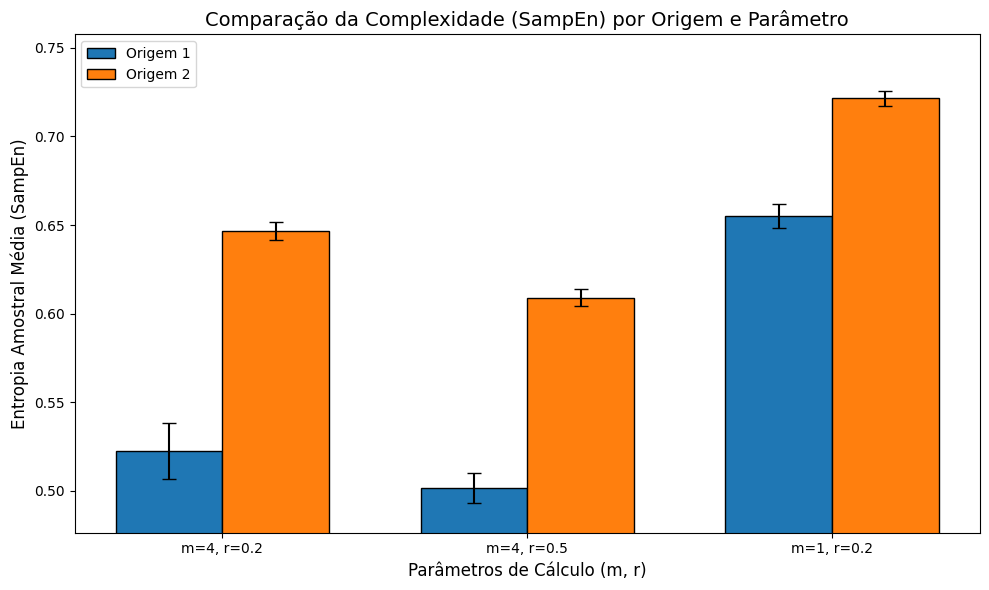

In [ ]:

# 1. DADOS DE ENTRADA
# 1.1. Dados: m=4, r=0.2*SD
sampen_4_02_o1 = np.array([
    0.5267, 0.5129, 0.5107, 0.5062, 0.5337, 0.5241, 0.5284, 0.5335, 0.5456, 0.5445,
    0.5302, 0.4851, 0.5252, 0.5170, 0.5240, 0.5155, 0.4837, 0.5245, 0.5207, 0.5225,
    0.5312, 0.5573, 0.5307, 0.5141, 0.5176
])
sampen_4_02_o2 = np.array([
    0.6395, 0.6551, 0.6493, 0.6446, 0.6435, 0.6404, 0.6495, 0.6537, 0.6395, 0.6424,
    0.6499, 0.6514, 0.6466, 0.6495, 0.6435, 0.6424, 0.6551, 0.6409, 0.6581, 0.6479,
    0.6428, 0.6425, 0.6457, 0.6461, 0.6509
])

# 1.2. Dados: m=4, r=0.5*SD
sampen_4_05_o1 = np.array([
    0.4994, 0.4903, 0.5026, 0.4998, 0.5003, 0.5039, 0.5170, 0.5215, 0.5032, 0.5008,
    0.4933, 0.4924, 0.4969, 0.4972, 0.4994, 0.5140, 0.4880, 0.4902, 0.5132, 0.5073,
    0.5090, 0.5069, 0.4974, 0.4994, 0.4939
])
sampen_4_05_o2 = np.array([
    0.6123, 0.6189, 0.6108, 0.6080, 0.6082, 0.6064, 0.6062, 0.6066, 0.6121, 0.6013,
    0.6126, 0.6088, 0.6103, 0.6079, 0.6030, 0.6162, 0.6145, 0.6063, 0.6111, 0.6030,
    0.6098, 0.5983, 0.6142, 0.6067, 0.6126
])

# 1.3. Dados: m=1, r=0.2*SD
sampen_1_02_o1 = np.array([
    0.6606, 0.6530, 0.6613, 0.6608, 0.6536, 0.6542, 0.6648, 0.6661, 0.6622, 0.6614,
    0.6526, 0.6368, 0.6513, 0.6533, 0.6473, 0.6541, 0.6447, 0.6492, 0.6618, 0.6597,
    0.6561, 0.6575, 0.6505, 0.6523, 0.6516
])
sampen_1_02_o2 = np.array([
    0.7256, 0.7298, 0.7232, 0.7167, 0.7243, 0.7157, 0.7180, 0.7191, 0.7157, 0.7172,
    0.7214, 0.7231, 0.7193, 0.7254, 0.7167, 0.7238, 0.7257, 0.7135, 0.7265, 0.7212,
    0.7240, 0.7189, 0.7263, 0.7222, 0.7259
])

# 2. AGRUPAMENTO E CÁLCULO DAS ESTATÍSTICAS

# Nomes para o eixo X
labels = ['m=4, r=0.2', 'm=4, r=0.5', 'm=1, r=0.2']

# Média e Desvio Padrão para Origem 1
means_o1 = [np.mean(sampen_4_02_o1), np.mean(sampen_4_05_o1), np.mean(sampen_1_02_o1)]
stds_o1 = [np.std(sampen_4_02_o1), np.std(sampen_4_05_o1), np.std(sampen_1_02_o1)]

# Média e Desvio Padrão para Origem 2
means_o2 = [np.mean(sampen_4_02_o2), np.mean(sampen_4_05_o2), np.mean(sampen_1_02_o2)]
stds_o2 = [np.std(sampen_4_02_o2), np.std(sampen_4_05_o2), np.std(sampen_1_02_o2)]


# 3. CRIAÇÃO DO GRÁFICO DE BARRAS
x = np.arange(len(labels))  # Localizações dos rótulos
width = 0.35  # Largura das barras

fig, ax = plt.subplots(figsize=(10, 6))

# Barras para Origem 1 (Azul)
rects1 = ax.bar(x - width/2, means_o1, width,
                yerr=stds_o1, capsize=5,
                label='Origem 1', color='#1f77b4', edgecolor='black', linewidth=1)

# Barras para Origem 2 (Laranja)
rects2 = ax.bar(x + width/2, means_o2, width,
                yerr=stds_o2, capsize=5,
                label='Origem 2', color='#ff7f0e', edgecolor='black', linewidth=1)


ax.set_ylabel('Entropia Amostral Média (SampEn)', fontsize=12)
ax.set_xlabel('Parâmetros de Cálculo (m, r)', fontsize=12)
ax.set_title('Comparação da Complexidade (SampEn) por Origem e Parâmetro', fontsize=14)
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend(loc='upper left')
y_min_limit = min(means_o1 + means_o2) * 0.95
ax.set_ylim(y_min_limit, max(means_o1 + means_o2) * 1.05)

#ax.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

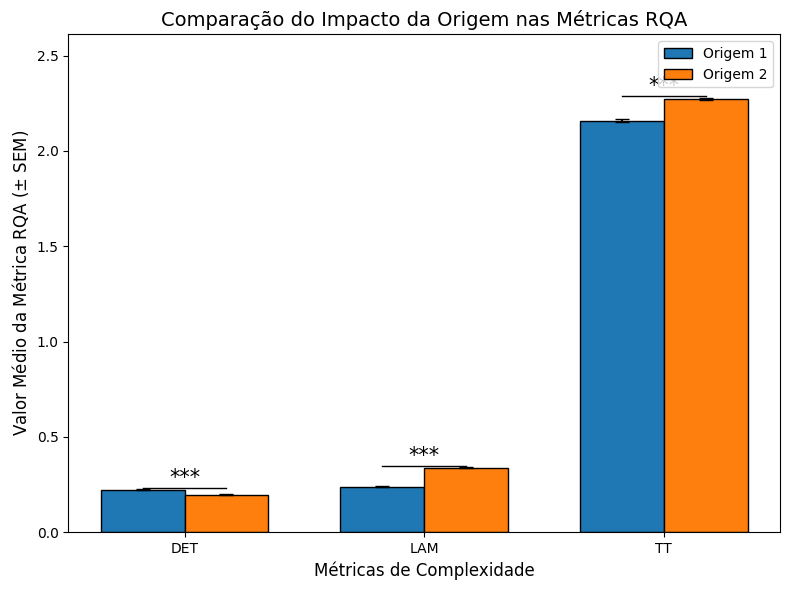

In [ ]:
from scipy.stats import sem # Importa o Erro Padrão da Média

# 1. DADOS DE ENTRADA E CÁLCULO DE ESTATÍSTICAS

# 1.1. Dados de RQA Brutos (N=25 em cada grupo, extraídos de análises anteriores)
# Usaremos esses dados para calcular o SEM.

# DET - Determinism
det_o1 = np.array([
    0.225664, 0.238962, 0.223990, 0.237810, 0.232827, 0.219628, 0.221470, 0.233179, 0.237204, 0.242408,
    0.225681, 0.218393, 0.197346, 0.214947, 0.216182, 0.222166, 0.210211, 0.229093, 0.228054, 0.226906,
    0.200944, 0.237145, 0.215081, 0.219256, 0.209509
])
det_o2 = np.array([
    0.180273, 0.189301, 0.205043, 0.178631, 0.177940, 0.192904, 0.189259, 0.174609, 0.184858, 0.189178,
    0.213036, 0.190461, 0.203977, 0.197641, 0.211329, 0.215362, 0.176557, 0.189401, 0.192101, 0.221498,
    0.193456, 0.214447, 0.202567, 0.206150, 0.195940
])

# LAM - Laminarity
lam_o1 = np.array([
    0.245173, 0.252058, 0.234061, 0.238999, 0.229864, 0.237636, 0.239799, 0.226469, 0.241442, 0.249418,
    0.243395, 0.243334, 0.217995, 0.239752, 0.250531, 0.242820, 0.234382, 0.234499, 0.238913, 0.250408,
    0.218859, 0.232659, 0.233460, 0.266941, 0.239416
])
lam_o2 = np.array([
    0.324533, 0.346085, 0.345785, 0.332111, 0.322141, 0.341501, 0.341377, 0.323878, 0.342596, 0.343291,
    0.359309, 0.318040, 0.351696, 0.332096, 0.341796, 0.346846, 0.319280, 0.347520, 0.332187, 0.351004,
    0.338437, 0.353123, 0.330428, 0.362405, 0.336714
])

# TT - Trapping Time
tt_o1 = np.array([
    2.168854, 2.162450, 2.134123, 2.147918, 2.121624, 2.138558, 2.154572, 2.123430, 2.154094, 2.167744,
    2.220908, 2.152362, 2.117276, 2.159996, 2.176366, 2.153805, 2.127752, 2.136843, 2.148433, 2.218445,
    2.119813, 2.141171, 2.152316, 2.297886, 2.161588
])
tt_o2 = np.array([
    2.239946, 2.285966, 2.281349, 2.235828, 2.253937, 2.281907, 2.274349, 2.246566, 2.256060, 2.291973,
    2.325893, 2.246939, 2.256351, 2.260003, 2.276478, 2.268287, 2.229092, 2.295133, 2.260610, 2.327924,
    2.260341, 2.292790, 2.301226, 2.286711, 2.247743
])

# 1.2. Estrutura dos dados para plotagem
metrics = ['DET', 'LAM', 'TT']
data_o1 = [det_o1, lam_o1, tt_o1]
data_o2 = [det_o2, lam_o2, tt_o2]

# 1.3. Cálculo das Médias e SEMs
means_o1 = [np.mean(d) for d in data_o1]
sems_o1 = [sem(d) for d in data_o1] # Erro Padrão da Média (SEM)
means_o2 = [np.mean(d) for d in data_o2]
sems_o2 = [sem(d) for d in data_o2]

# ==========================================================
# 2. CRIAÇÃO DO GRÁFICO DE BARRAS AGRUPADAS
# ==========================================================

x = np.arange(len(metrics)) # Localizações dos rótulos
width = 0.35 # Largura das barras

fig, ax = plt.subplots(figsize=(8, 6))

# Barras para Origem 1 (Azul)
rects1 = ax.bar(x - width/2, means_o1, width,
                yerr=sems_o1, capsize=5,
                label='Origem 1', color='#1f77b4', edgecolor='black', linewidth=1) # C0

# Barras para Origem 2 (Laranja)
rects2 = ax.bar(x + width/2, means_o2, width,
                yerr=sems_o2, capsize=5,
                label='Origem 2', color='#ff7f0e', edgecolor='black', linewidth=1) # C1

# Adicionar asteriscos (***) para indicar significância (p < 0.001)
# Todos os seus p-valores são extremamente significativos (p < 1e-7).
significance_level = '***'
asterisk_heights = [max(m1 + s1, m2 + s2) + 0.015 for m1, s1, m2, s2 in zip(means_o1, sems_o1, means_o2, sems_o2)]

# Adicionar linha horizontal e asterisco para a diferença significativa
for i in range(len(metrics)):
    # Linha acima das barras
    bar_height = max(means_o1[i] + sems_o1[i], means_o2[i] + sems_o2[i])
    line_y = bar_height + (0.005 * (metrics[i] != 'TT') + 0.01 * (metrics[i] == 'TT')) # Ajuste fino para o TT

    # Desenha a linha de ligação
    ax.plot([x[i] - width/2, x[i] + width/2], [line_y, line_y],
            lw=1, color='black')

    # Adiciona o asterisco
    ax.text(x[i], line_y + 0.002, significance_level,
            ha='center', va='bottom', fontsize=15, color='black')


# --- Configurações Finais ---
ax.set_ylabel('Valor Médio da Métrica RQA ($\pm$ SEM)', fontsize=12)
ax.set_xlabel('Métricas de Complexidade', fontsize=12)
ax.set_title('Comparação do Impacto da Origem nas Métricas RQA', fontsize=14)
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend(loc='upper right')
# ax.grid(axis='y', linestyle='--', alpha=0.5)

# Ajustar o limite Y para garantir que os asteriscos sejam visíveis
y_max_limit = max(means_o1 + means_o2) * 1.15
ax.set_ylim(bottom=0, top=y_max_limit)

plt.tight_layout()
plt.show()